This is an example of using using SIM to measure the object diamiter by taking street trees as an example. 

Input: 
- depthmap from DINOv2
- segmented street images from SAM
- metadata including GPS coordinates and heading direction of street images.

Output: 
- estimated object diameter in meters.
- visualized triangulation results.

Input example:

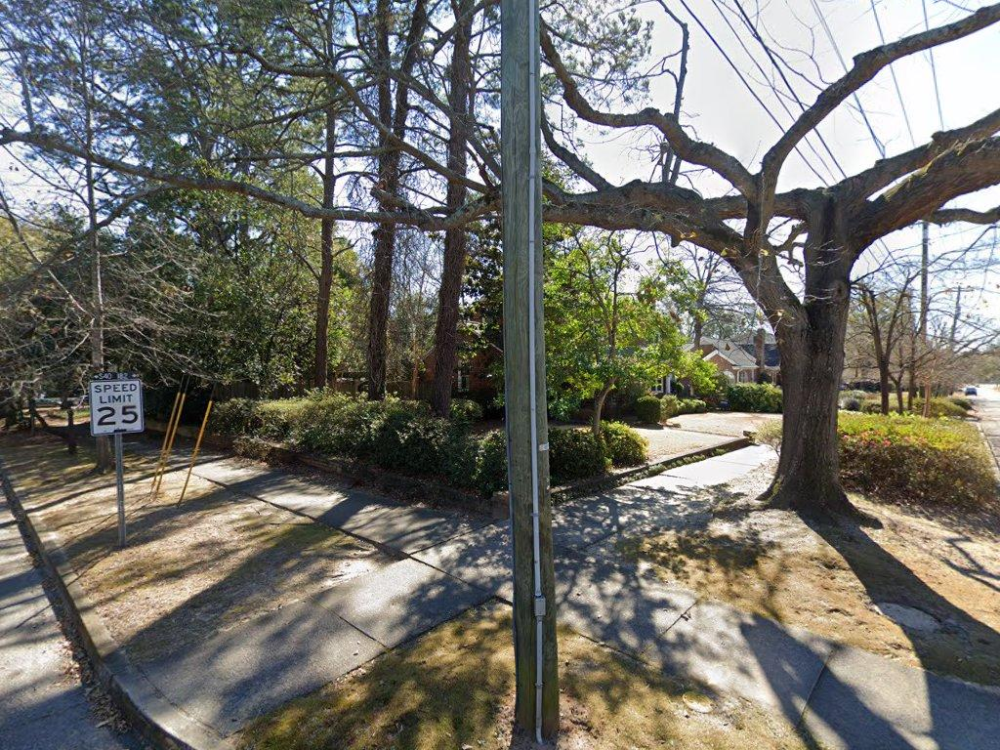

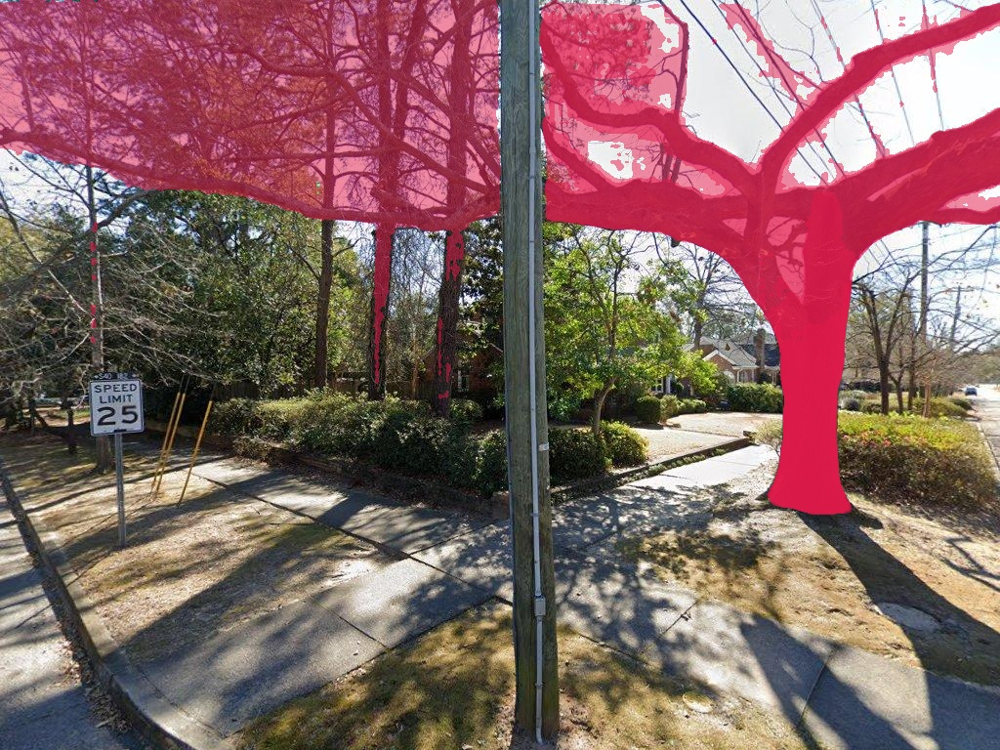

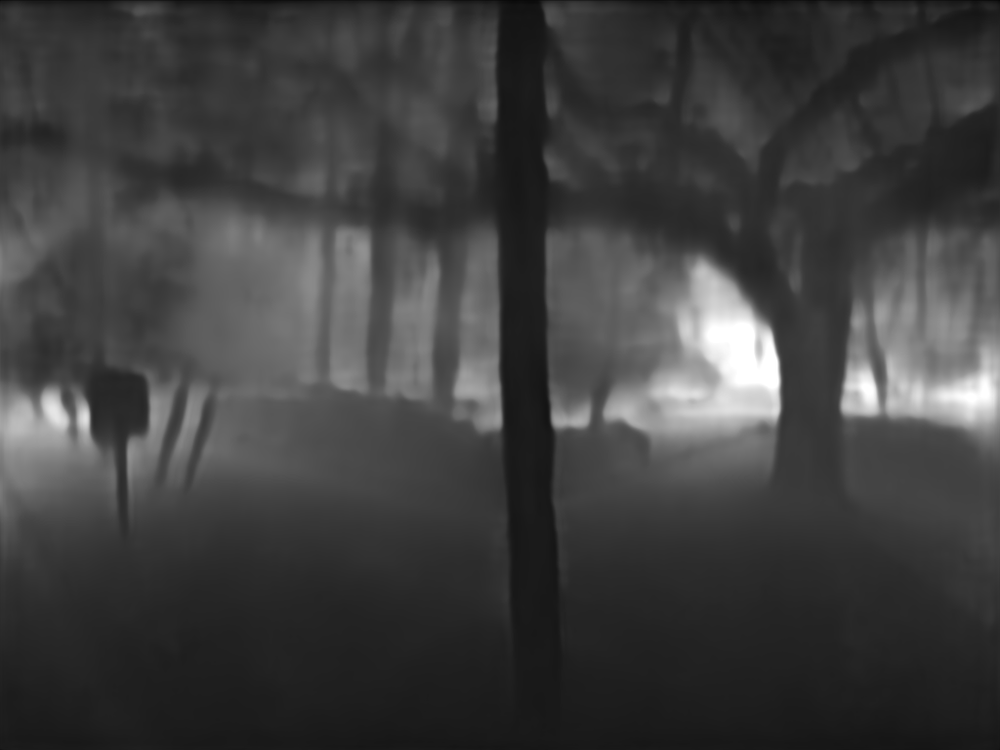

Output example (not related with the above input example):

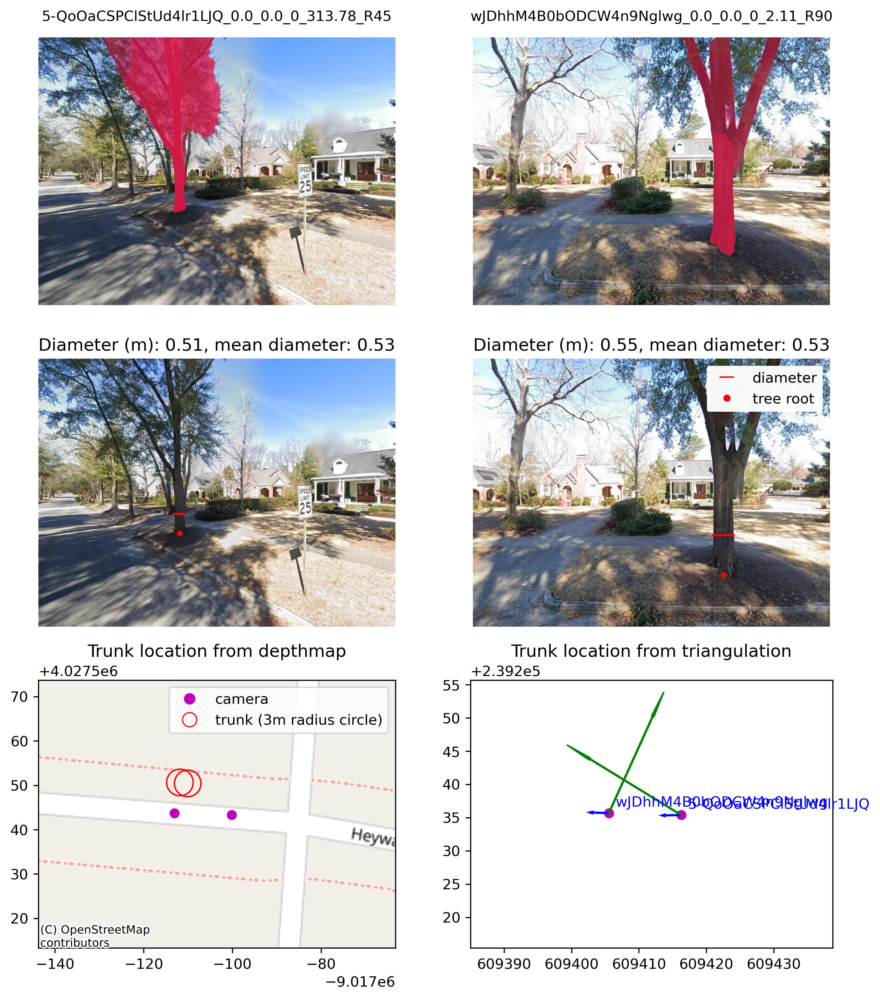

In [1]:
# import matplotlib.patches as patches
import supervision as sv

import sys
import numpy as np
import glob
import os
import bz2
import pandas as pd
import geopandas as gpd
import pickle
from PIL import Image
import street_triangulation as tri  # key module for diameter measurement
import supervision as sv
import cv2
import math
import pdb
import contextily as ctx
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', None)



pd.set_option('display.max_columns', None)

# sys.path.append(r'E:\Research\StreetView\gsv_pano')
sys.path.append(r'gsv_pano')  # key module for street view panorama handling

from pano import GSV_pano
import utils

%load_ext autoreload
%autoreload 2

In [2]:
data_dir = r'experiment_data'

# detection results from Grounded-SAM
annotated_dir = os.path.join(data_dir, 'Heyward_st_pano_thumnail_segmented')

# depth maps from DINOv2
depthmap_dir = os.path.join(data_dir, 'Heyward_st_pano_thumnail_depth')

# thumbnail images from Google Street View
# see: https://github.com/gladcolor/StreetView 
image_dir = os.path.join(data_dir, 'Heyward_st_pano_thumnail')

# metadata including GPS coordinates and heading direction of street images, from Google Street View
# used repository: https://github.com/gladcolor/StreetView 
pano_meta_fname = os.path.join(data_dir, "Heyward_st_pano_thumnail.csv")

local_crs = 6569 # EPSG:6569, NAD83(2011) / South Carolina

# results will be saved here
save_dir = os.path.join(data_dir, 'Heyward_st_trunks')
os.makedirs(save_dir, exist_ok=True)

# class names and indices used to extract the masks from Grounded-SAM results
CLASSES = ['tree_trunk']   # , 'tree root collar'
trunk_index = 0

In [3]:
import sys
print(sys.executable)

e:\ProgramData\Anaconda3\envs\street_mapping_env\python.exe


In [4]:
#  street image parameters
img_height = 768
img_width = 1024

camera_dis_thres =  30  # alon consider trees within 30 meters
trunk_near_thres = 3  # detect trunks within 3 meters will be treated as the same tree

In [5]:
pano_meta_df = pd.read_csv(pano_meta_fname).set_index('panoId')
pano_meta_df

,image_width,image_height,tile_width,tile_height,image_date,imagery_type,projection_type,pano_yaw_deg,tilt_yaw_deg,tilt_pitch_deg,zoomLevels,lat,lng,original_lat,original_lng,elevation_wgs84_m,description,streetRange,region,country,elevation_egm96_m,links_cnt,link_forward_yawDeg,link_f_panoId,link_f_road_argb,link_f_description,link_backward_yawDeg,link_b_panoId,link_b_road_argb,link_b_description,link_others
panoId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
znuYMYuRAnWodO_nKEcpAw,13312,6656,512,512,2014-8,1,spherical,5.234205,90.486496,1.345668,NaN,33.990883,-81.006261,NaN,NaN,NaN,101 S Woodrow St,NaN,Columbia; South Carolina,US,89.712708,4,4.480649,iwIR7ReTsovIl2NEO1n1jA,NaN,Woodrow St,279.834473,oUNvMa7PVtjhDnx-1NnsTQ,NaN,Heyward St,89.1512451171875|_dSD7M9ggy25Y8ocd3bOVw||Heywa...
bD0H1wJkNsf920LkpU9bXA,16384,8192,512,512,2022-2,1,spherical,183.540970,88.687180,0.508491,NaN,33.990815,-81.006311,NaN,NaN,NaN,101 S Woodrow St,NaN,Columbia; South Carolina,US,89.003746,2,184.599854,p4RFDXvkNmC42i42QrU10Q,NaN,S Woodrow St,4.619255,znuYMYuRAnWodO_nKEcpAw,NaN,S Woodrow St,NaN
p4RFDXvkNmC42i42QrU10Q,16384,8192,512,512,2022-2,1,spherical,183.230072,89.076469,0.397373,NaN,33.990722,-81.006318,NaN,NaN,NaN,100 S Woodrow St,NaN,Columbia; South Carolina,US,88.850060,2,184.667160,HLEanEQavzLGOgt1CAy8tA,NaN,S Woodrow St,4.599847,bD0H1wJkNsf920LkpU9bXA,NaN,S Woodrow St,NaN
HLEanEQavzLGOgt1CAy8tA,16384,8192,512,512,2021-12,1,spherical,184.593185,89.518768,1.281742,NaN,33.990650,-81.006327,NaN,NaN,NaN,100 S Woodrow St,NaN,Columbia; South Carolina,US,88.781258,2,184.638870,ye0Bj3kdK30YplYkpneKdQ,NaN,S Woodrow St,4.667163,p4RFDXvkNmC42i42QrU10Q,NaN,S Woodrow St,NaN
ye0Bj3kdK30YplYkpneKdQ,16384,8192,512,512,2022-2,1,spherical,183.486938,88.766350,0.703531,NaN,33.990631,-81.006325,NaN,NaN,NaN,100 S Woodrow St,NaN,Columbia; South Carolina,US,88.756538,2,184.591965,o3bXwz6__nb8XqfLceHOxA,NaN,S Woodrow St,4.638868,HLEanEQavzLGOgt1CAy8tA,NaN,S Woodrow St,NaN
o3bXwz6__nb8XqfLceHOxA,16384,8192,512,512,2022-2,1,spherical,183.671402,89.011391,0.560617,NaN,33.990540,-81.006333,NaN,NaN,NaN,100 S Woodrow St,NaN,Columbia; South Carolina,US,88.636826,2,184.638870,9uzvJYjfhOL1PVl_1DcnTw,NaN,S Woodrow St,4.591967,ye0Bj3kdK30YplYkpneKdQ,NaN,S Woodrow St,NaN
_dSD7M9ggy25Y8ocd3bOVw,16384,8192,512,512,2022-2,1,spherical,51.891716,89.616928,1.880051,NaN,33.990849,-81.006216,NaN,NaN,NaN,2700 Heyward St,NaN,Columbia; South Carolina,US,88.909752,2,94.366425,1qTopLEo4k5euVrLowCI_w,NaN,Heyward St,269.151245,znuYMYuRAnWodO_nKEcpAw,NaN,S Woodrow St,NaN
1qTopLEo4k5euVrLowCI_w,16384,8192,512,512,2022-2,1,spherical,90.228859,88.601852,2.083669,NaN,33.990864,-81.006107,NaN,NaN,NaN,2700 Heyward St,NaN,Columbia; South Carolina,US,88.770836,2,94.336792,XShHFvEc3Mi2fhPmjY7OGw,NaN,Heyward St,274.366425,_dSD7M9ggy25Y8ocd3bOVw,NaN,Heyward St,NaN
XShHFvEc3Mi2fhPmjY7OGw,16384,8192,512,512,2022-2,1,spherical,90.967476,88.490463,0.931262,NaN,33.990862,-81.005986,NaN,NaN,NaN,2701 Heyward St,NaN,Columbia; South Carolina,US,88.509941,2,94.389107,piIyY_Bgq2dmllHQlN7FRw,NaN,Heyward St,274.336792,1qTopLEo4k5euVrLowCI_w,NaN,Heyward St,NaN


In [6]:
detect_files = glob.glob(os.path.join(annotated_dir, "*.bz2"))
detect_files = sorted(detect_files)
print("Found file count:", len(detect_files))

# ['D:\\OneDrive_PSU\\OneDrive - The Pennsylvania State University\\Research_doc\\street_image_mapping\\Heyward_st_pano_thumnail_segmented\\piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2']
# detect_files = ['D:\\OneDrive_PSU\\OneDrive - The Pennsylvania State University\\Research_doc\\street_image_mapping\\Heyward_st_pano_thumnail_segmented\\piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2', 'D:\\OneDrive_PSU\\OneDrive - The Pennsylvania State University\\Research_doc\\street_image_mapping\\Heyward_st_pano_thumnail_segmented\\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_180.97_R90.pkl.bz2'] + detect_files  # add a file on the top for testing
# detect_files
# detect_files = ['D:\\OneDrive_PSU\\OneDrive - The Pennsylvania State University\\Research_doc\\street_image_mapping\\Heyward_st_pano_thumnail_segmented\\L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_273.58_R90.pkl.bz2'] + detect_files  # add a file on the top for testing


# print("Found file count:", len(detect_files))

Found file count: 762


In [ ]:
pair_trunk_df_list = []

for idx, detect_file in enumerate(detect_files[:]): # 458:460
    try:
        # print("detect_file: ", detect_file)
        # detect_file = os.path.join(detect_dir, r'l-PhEd7ACdyR12n08p1Q0Q_0.0_0.0_0_33.59_R90.pkl.bz2')  # [68:69]
        # detect_file = os.path.join(detect_dir, r'XciMXMjYPg0jhKh8cKG1eA_0.0_0.0_0_78.39_R135.pkl.bz2')
        # detect_file = os.path.join(detect_dir, r'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_48.96_L45.pkl.bz2')
        
        gdf_list = []

        basename = os.path.basename(detect_file).replace('.pkl.bz2', '.jpg')
        direction_str = basename.replace(".pkl.bz2", "").split("_")[-1]

        image_fname = os.path.join(image_dir, basename)

        
        # Step 1: form image pairs. 1) select a non-look behind direction. 2) 
        # non-look behind direction: R90, R45, L90, L45.
        # look behind direction:     L135, R135. 

        # skip the look behind image
        if direction_str in ['L135', 'R135']:  #  I make a mistake when naming the thumbnails in State College: the "L135" and "L45" should be switched.
            print("skip: ", direction_str, basename)
 
        print(f"Processing: {idx + 1} / {len(detect_files)}: {basename}" )


        # find image pairs
        panoID = basename[:22]
        pano_meta = pano_meta_df.loc[panoID]
        # print("pano_meta:", pano_meta)

        # obtain image pairs: R90 <-> R135, R45 <-> R90, L90 <-> L135, L45 <-> L90, 
        image_pairs = tri.form_image_pairs(detect_file, pano_meta, detect_dir=None)
        # print("idx:", idx)


        if len(image_pairs) == 0:
            print("    No image_pairs, skip. \n")
            continue

        else:
            for img1, img2 in image_pairs:
                print(f"    image pairs: {os.path.basename(img1), os.path.basename(img2)}")

        print()
        # print("idx:", idx)

        # extract the trunks in the current image
        trunk_df = tri.get_trunks_in_an_image(detect_file, trunk_index, image_dir, pano_meta_df, depthmap_dir, local_crs)
        # print("trunk_df:", trunk_df)
        # print("idx:", idx, trunk_df)  # passed

        # Step 2:  form trunk pairs
        # extract the trunks in the paire image
        for pair in image_pairs:
            print("pair[1]:", pair[1])
            paired_trunk_df = tri.get_trunks_in_an_image(pair[1], trunk_index, image_dir, pano_meta_df, depthmap_dir, local_crs)
            # print("paired_trunk_df:", paired_trunk_df)  

            # merge trunks into a GeoDataFrame
            all_gdf = tri.merge_trunk_df_pair(trunk_df, paired_trunk_df, local_crs)
            # print("all_gdf:", all_gdf)
    
            all_trunk_gdf = all_gdf.query("Type == 'trunk' ")
            # all_trunk_gdf['depth_x'] = all_trunk_gdf['depth_x'].astype('float')
            # all_trunk_gdf['depth_y'] = all_trunk_gdf['depth_y'].astype('float')
            all_trunk_gdf = all_trunk_gdf.reset_index()
    
            # all_camera_gdf = all_gdf.query("Type == 'camera' ")
            # print("all_camera_gdf:", all_camera_gdf)
    
            # form trunck pairs
            trunk_pairs_df = tri.form_trunk_pairs(all_trunk_gdf, near_thres=trunk_near_thres, camera_dis_thres=camera_dis_thres)
    
            if trunk_pairs_df is None:
                print("    No trunk pairs.")
                continue
    
            # print("trunk_pairs_df:", trunk_pairs_df)
    
            pair_cnt = int(len(trunk_pairs_df) / 2)
    
            # print("all_trunk_gdf:", all_trunk_gdf)
    
            # draw the trunks
            for p in range(pair_cnt):
                a_pair_trunk_df = trunk_pairs_df.iloc[2 * p:2 * p + 2].copy()
                a_pair_trunk_df = tri.triangulate_trunk_location(a_pair_trunk_df)  # compute location
                
                a_pair_trunk_df = tri.compute_diameter(a_pair_trunk_df)  # compute diameters
    
                pair_trunk_df_list.append(a_pair_trunk_df)
    
                tri.show_detailed_images(a_pair_trunk_df, local_crs, image_dir, annotated_dir, save_dir)
    
            print()
            # break

    except Exception as e:
        print()
        print("Error:", e, idx, basename)
        print()
        # break


all_pair_trunk_df = pd.concat(pair_trunk_df_list)
csv_fname = os.path.join(save_dir, "detected_trunks.csv")
all_pair_trunk_df.to_csv(csv_fname, index=False)

geometry = gpd.points_from_xy(all_pair_trunk_df['tri_x'], all_pair_trunk_df['tri_y'])
localized_trunk_gdf = gpd.GeoDataFrame(data=all_pair_trunk_df, geometry=geometry).set_crs(local_crs)
localized_trunk_fname = os.path.join(save_dir, "localized_trunks.shp")
localized_trunk_gdf.to_file(localized_trunk_fname)
localized_trunk_gdf

# needs about 40 minute to process 762 images, including visualization. 750 meter in total.
# 2 minutes for 762 images without visualization.

Processing: 1 / 762: -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_138.68_R45.jpg
    image pairs: ('-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_138.68_R45.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_228.49_R135.pkl.bz2')
    image pairs: ('-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_138.68_R45.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_183.49_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_228.49_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_183.49_R90.pkl.bz2



Processing: 2 / 762: -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_183.68_R90.jpg
    image pairs: ('-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_183.68_R90.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_228.49_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_228.49_R135.pkl.bz2



Processing: 3 / 762: -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_228.68_R135.jpg
skip the backward thumbnail:  R135 -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_228.68_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 4 / 762: -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_3.68_L90.jpg
    image pairs: ('-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_3.68_L90.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2



Processing: 5 / 762: -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_318.68_L135.jpg
skip the backward thumbnail:  L135 -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_318.68_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 6 / 762: -apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_48.68_L45.jpg
    image pairs: ('-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_48.68_L45.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2')
    image pairs: ('-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_48.68_L45.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_3.49_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_3.49_L90.pkl.bz2
    No trunk pairs.
Processing: 7 / 762: -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_139.61_R45.jpg
    image pairs: ('-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_139.61_R45.pkl.bz2', 'AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.pkl.bz2')
    image pairs: ('-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_139.61_R45.pkl.bz2', 'AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_185.69_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_185.69_R90.pkl.bz2



Processing: 8 / 762: -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_184.61_R90.jpg
    image pairs: ('-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_184.61_R90.pkl.bz2', 'AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.pkl.bz2



Processing: 9 / 762: -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_229.61_R135.jpg
skip the backward thumbnail:  R135 -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_229.61_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 10 / 762: -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_319.61_L135.jpg
skip the backward thumbnail:  L135 -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_319.61_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 11 / 762: -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_4.61_L90.jpg
    image pairs: ('-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_4.61_L90.pkl.bz2', 'AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_320.69_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_320.69_L135.pkl.bz2



Processing: 12 / 762: -fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_49.61_L45.jpg
    image pairs: ('-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_49.61_L45.pkl.bz2', 'AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_320.69_L135.pkl.bz2')
    image pairs: ('-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_49.61_L45.pkl.bz2', 'AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_5.69_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_320.69_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_5.69_L90.pkl.bz2



Processing: 13 / 762: 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_165.30_R45.jpg
    image pairs: ('0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_165.30_R45.pkl.bz2', 'GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_256.78_R135.pkl.bz2')
    image pairs: ('0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_165.30_R45.pkl.bz2', 'GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_211.78_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_256.78_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_211.78_R90.pkl.bz2

Error: cannot convert float NaN to integer 12 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_165.30_R45.jpg

Processing: 14 / 762: 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_210.30_R90.jpg
    image pairs: ('0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_210.30_R90.pkl.bz2', 'GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_256.78_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_256.78_R135.pkl.bz2



Processing: 15 / 762: 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_255.30_R135.jpg
skip the backward thumbnail:  R135 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_255.30_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 16 / 762: 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_30.30_L90.jpg
    image pairs: ('0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_30.30_L90.pkl.bz2', 'GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_346.78_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_346.78_L135.pkl.bz2



Processing: 17 / 762: 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_345.30_L135.jpg
skip the backward thumbnail:  L135 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_345.30_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 18 / 762: 0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_75.30_L45.jpg
    image pairs: ('0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_75.30_L45.pkl.bz2', 'GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_346.78_L135.pkl.bz2')
    image pairs: ('0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_75.30_L45.pkl.bz2', 'GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_31.78_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_346.78_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_31.78_L90.pkl.bz2



Processing: 19 / 762: 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_140.09_R45.jpg
    image pairs: ('15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_140.09_R45.pkl.bz2', 'kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_228.70_R135.pkl.bz2')
    image pairs: ('15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_140.09_R45.pkl.bz2', 'kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_183.70_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_228.70_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_183.70_R90.pkl.bz2



Processing: 20 / 762: 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_185.09_R90.jpg
    image pairs: ('15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_185.09_R90.pkl.bz2', 'kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_228.70_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_228.70_R135.pkl.bz2



Processing: 21 / 762: 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_230.09_R135.jpg
skip the backward thumbnail:  R135 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_230.09_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 22 / 762: 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_320.09_L135.jpg
skip the backward thumbnail:  L135 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_320.09_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 23 / 762: 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_5.09_L90.jpg
    image pairs: ('15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_5.09_L90.pkl.bz2', 'kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_318.70_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_318.70_L135.pkl.bz2



Processing: 24 / 762: 15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_50.09_L45.jpg
    image pairs: ('15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_50.09_L45.pkl.bz2', 'kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_318.70_L135.pkl.bz2')
    image pairs: ('15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_50.09_L45.pkl.bz2', 'kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_3.70_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_318.70_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_3.70_L90.pkl.bz2



Processing: 25 / 762: 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_0.23_L90.jpg
    image pairs: ('1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_0.23_L90.pkl.bz2', 'XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_315.97_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_315.97_L135.pkl.bz2
    No trunk pairs.
Processing: 26 / 762: 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_135.23_R45.jpg
    image pairs: ('1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_135.23_R45.pkl.bz2', 'XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_225.97_R135.pkl.bz2')
    image pairs: ('1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_135.23_R45.pkl.bz2', 'XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_180.97_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_225.97_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_180.97_R90.pkl.bz2



Processing: 27 / 762: 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_180.23_R90.jpg
    image pairs: ('1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_180.23_R90.pkl.bz2', 'XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_225.97_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_225.97_R135.pkl.bz2



Processing: 28 / 762: 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_225.23_R135.jpg
skip the backward thumbnail:  R135 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_225.23_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 29 / 762: 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_315.23_L135.jpg
skip the backward thumbnail:  L135 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_315.23_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 30 / 762: 1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_45.23_L45.jpg
    image pairs: ('1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_45.23_L45.pkl.bz2', 'XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_315.97_L135.pkl.bz2')
    image pairs: ('1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_45.23_L45.pkl.bz2', 'XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_0.97_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_315.97_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_0.97_L90.pkl.bz2



Processing: 31 / 762: 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_139.32_R45.jpg
    image pairs: ('1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_139.32_R45.pkl.bz2', 'DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_228.77_R135.pkl.bz2')
    image pairs: ('1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_139.32_R45.pkl.bz2', 'DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_183.77_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_228.77_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_183.77_R90.pkl.bz2



Processing: 32 / 762: 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_184.32_R90.jpg
    image pairs: ('1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_184.32_R90.pkl.bz2', 'DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_228.77_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_228.77_R135.pkl.bz2
    No trunk pairs.
Processing: 33 / 762: 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_229.32_R135.jpg
skip the backward thumbnail:  R135 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_229.32_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 34 / 762: 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_319.32_L135.jpg
skip the backward thumbnail:  L135 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_319.32_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 35 / 762: 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_4.32_L90.jpg
    image pairs: ('1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_4.32_L90.pkl.bz2', 'DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_318.77_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_318


Processing: 36 / 762: 1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_49.32_L45.jpg
    image pairs: ('1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_49.32_L45.pkl.bz2', 'DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_318.77_L135.pkl.bz2')
    image pairs: ('1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_49.32_L45.pkl.bz2', 'DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_3.77_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_318.77_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_3.77_L90.pkl.bz2



Processing: 37 / 762: 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_142.36_R45.jpg
    image pairs: ('1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_142.36_R45.pkl.bz2', 'AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_232.68_R135.pkl.bz2')
    image pairs: ('1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_142.36_R45.pkl.bz2', 'AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_187.68_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_232.68_R135.pkl.bz2

Error: list index out of range 36 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_142.36_R45.jpg

Processing: 38 / 762: 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_187.36_R90.jpg
    image pairs: ('1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_187.36_R90.pkl.bz2', 'AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_232.68_R135.pkl.bz2')


Error: cannot convert float NaN to integer 37 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_187.36_R90.jpg

Processing: 39 / 762: 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_232.36_R135.jpg
skip the backward thumbnail:  R135 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_232.36_R135.pkl.bz2
    No image_pairs,

    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_7.68_L90.pkl.bz2
    No trunk pairs.
Processing: 42 / 762: 1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_7.36_L90.jpg
    image pairs: ('1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_7.36_L90.pkl.bz2', 'AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_322.68_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_322.68_L135.pkl.bz2
    No trunk pairs.
Processing: 43 / 762: 21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_137.65_R135.jpg
skip the backward thumbnail:  R135 21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_137.65_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 44 / 762: 21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_227.65_L135.jpg
skip the backward thumbnail:  L135 21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_227.65_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 45 / 762: 21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_272.65_L90.jpg
    No image_pairs, skip. 

Processing: 46 / 762: 21nXy5yFNE0n-kGLgZrTQg_0.0_


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_183.58_R90.pkl.bz2
    No trunk pairs.
Processing: 50 / 762: 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_182.35_R90.jpg
    image pairs: ('2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_182.35_R90.pkl.bz2', 'Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_228.58_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_228.58_R135.pkl.bz2



Processing: 51 / 762: 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_2.35_L90.jpg
    image pairs: ('2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_2.35_L90.pkl.bz2', 'Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_318.58_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_318.58_L135.pkl.bz2
    No trunk pairs.
Processing: 52 / 762: 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_227.35_R135.jpg
skip the backward thumbnail:  R135 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_227.35_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 53 / 762: 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_317.35_L135.jpg
skip the backward thumbnail:  L135 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_317.35_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 54 / 762: 2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_47.35_L45.jpg
    image pairs: ('2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_47.35_L45.pkl.bz2', 'Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_318.58_L135.pkl.bz2')
    image pairs: ('2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_47.35_L45.pkl.bz2', 'Q1nm7SSKRmPKA1mtQBeEOQ_0.0


Processing: 55 / 762: 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_135.75_L45.jpg
    image pairs: ('3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_135.75_L45.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_44.92_L135.pkl.bz2')
    image pairs: ('3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_135.75_L45.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_89.92_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_44.92_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_89.92_L90.pkl.bz2
    No trunk pairs.
Processing: 56 / 762: 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_225.75_R45.jpg
    image pairs: ('3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_225.75_R45.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.pkl.bz2')
    image pairs: ('3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_225.75_R45.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_269.92_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg


Processing: 58 / 762: 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_315.75_R135.jpg
skip the backward thumbnail:  R135 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_315.75_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 59 / 762: 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_45.75_L135.jpg
skip the backward thumbnail:  L135 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_45.75_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 60 / 762: 3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_90.75_L90.jpg
    image pairs: ('3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_90.75_L90.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_44.92_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_44.92_L135.pkl.bz2



Processing: 61 / 762: 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_139.06_L45.jpg
    image pairs: ('3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_139.06_L45.pkl.bz2', 'sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_49.56_L135.pkl.bz2')
    image pairs: ('3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_139.06_L45.pkl.bz2', 'sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_94.56_L90.pkl.bz2')


Error: cannot convert float NaN to integer 60 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_139.06_L45.jpg

Processing: 62 / 762: 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_229.06_R45.jpg
    image pairs: ('3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_229.06_R45.pkl.bz2', 'sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_319.56_R135.pkl.bz2')
    image pairs: ('3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_229.06_R45.pkl.bz2', 'sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_274.56_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_319.56_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_274.56_R90.pkl.bz2

Err

    No trunk pairs.
Processing: 64 / 762: 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_319.06_R135.jpg
skip the backward thumbnail:  R135 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_319.06_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 65 / 762: 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_49.06_L135.jpg
skip the backward thumbnail:  L135 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_49.06_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 66 / 762: 3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_94.06_L90.jpg
    image pairs: ('3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_94.06_L90.pkl.bz2', 'sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_49.56_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_49.56_L135.pkl.bz2



Processing: 67 / 762: 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_133.78_L135.jpg
skip the backward thumbnail:  L135 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_133.78_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 68 / 762: 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_178.78_L90.jpg
    image pairs: ('5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_178.78_L90.pkl.bz2', 'wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_137.11_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_137.11_L135.pkl.bz2



Processing: 69 / 762: 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_223.78_L45.jpg
    image pairs: ('5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_223.78_L45.pkl.bz2', 'wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_137.11_L135.pkl.bz2')
    image pairs: ('5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_223.78_L45.pkl.bz2', 'wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_182.11_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_137.11_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_182.11_L90.pkl.bz2
    No trunk pairs.
Processing: 70 / 762: 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_313.78_R45.jpg
    image pairs: ('5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_313.78_R45.pkl.bz2', 'wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_47.11_R135.pkl.bz2')
    image pairs: ('5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_313.78_R45.pkl.bz2', 'wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_2.11_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_47.11_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_2.11_R90.pkl.bz2



Processing: 71 / 762: 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_358.78_R90.jpg
    image pairs: ('5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_358.78_R90.pkl.bz2', 'wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_47.11_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_47.11_R135.pkl.bz2
    No trunk pairs.
Processing: 72 / 762: 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_43.78_R135.jpg
skip the backward thumbnail:  R135 5-QoOaCSPClStUd4lr1LJQ_0.0_0.0_0_43.78_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 73 / 762: 5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_0.48_L45.jpg
    image pairs: ('5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_0.48_L45.pkl.bz2', 'y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_49.33_L135.pkl.bz2')
    image pairs: ('5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_0.48_L45.pkl.bz2', 'y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_94.33_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_49.33_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heywar


Processing: 80 / 762: 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_184.55_R90.jpg
    image pairs: ('5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_184.55_R90.pkl.bz2', 'Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_229.30_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_229.30_R135.pkl.bz2
    No trunk pairs.
Processing: 81 / 762: 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_229.55_R135.jpg
skip the backward thumbnail:  R135 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_229.55_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 82 / 762: 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_319.55_L135.jpg
skip the backward thumbnail:  L135 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_319.55_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 83 / 762: 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_4.55_L90.jpg
    image pairs: ('5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_4.55_L90.pkl.bz2', 'Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_319.30_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_319


Processing: 84 / 762: 5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_49.55_L45.jpg
    image pairs: ('5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_49.55_L45.pkl.bz2', 'Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_319.30_L135.pkl.bz2')
    image pairs: ('5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_49.55_L45.pkl.bz2', 'Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_4.30_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_319.30_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_4.30_L90.pkl.bz2



Processing: 85 / 762: 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_141.42_R45.jpg
    image pairs: ('5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_141.42_R45.pkl.bz2', '15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_230.09_R135.pkl.bz2')
    image pairs: ('5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_141.42_R45.pkl.bz2', '15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_185.09_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_230.09_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_185.09_R90.pkl.bz2



Processing: 86 / 762: 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_186.42_R90.jpg
    image pairs: ('5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_186.42_R90.pkl.bz2', '15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_230.09_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_230.09_R135.pkl.bz2



Processing: 87 / 762: 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_231.42_R135.jpg
skip the backward thumbnail:  R135 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_231.42_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 88 / 762: 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_321.42_L135.jpg
skip the backward thumbnail:  L135 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_321.42_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 89 / 762: 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_51.42_L45.jpg
    image pairs: ('5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_51.42_L45.pkl.bz2', '15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_320.09_L135.pkl.bz2')
    image pairs: ('5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_51.42_L45.pkl.bz2', '15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_5.09_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_320.09_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_5.09_L90.pkl.bz2



Processing: 90 / 762: 5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_6.42_L90.jpg
    image pairs: ('5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_6.42_L90.pkl.bz2', '15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_320.09_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\15oCd-mPagUVtzLLr7urPg_0.0_0.0_0_320.09_L135.pkl.bz2
    No trunk pairs.
Processing: 91 / 762: 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_141.78_L45.jpg
    image pairs: ('64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_141.78_L45.pkl.bz2', '3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_45.75_L135.pkl.bz2')
    image pairs: ('64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_141.78_L45.pkl.bz2', '3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_90.75_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_45.75_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_90.75_L90.pkl.bz2



Processing: 92 / 762: 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_231.78_R45.jpg
    image pairs: ('64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_231.78_R45.pkl.bz2', '3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_315.75_R135.pkl.bz2')
    image pairs: ('64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_231.78_R45.pkl.bz2', '3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_270.75_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_315.75_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_270.75_R90.pkl.bz2
    No trunk pairs.
Processing: 93 / 762: 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_276.78_R90.jpg
    image pairs: ('64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_276.78_R90.pkl.bz2', '3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_315.75_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_315.75_R135.pkl.bz2



Processing: 94 / 762: 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_321.78_R135.jpg
skip the backward thumbnail:  R135 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_321.78_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 95 / 762: 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_51.78_L135.jpg
skip the backward thumbnail:  L135 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_51.78_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 96 / 762: 64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_96.78_L90.jpg
    image pairs: ('64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_96.78_L90.pkl.bz2', '3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_45.75_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3KcssIfHMS2dkud-EWFGvw_0.0_0.0_0_45.75_L135.pkl.bz2
    No trunk pairs.
Processing: 97 / 762: 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_135.55_L45.jpg
    image pairs: ('6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_135.55_L45.pkl.bz2', 'LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_46.57_L135.pkl.bz2')
    image pairs: ('6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_135.55_L45.pkl.bz2', 'LecD4Sud6v5wRH-nS3IldA_0.0


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_91.57_L90.pkl.bz2



Processing: 98 / 762: 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_225.55_R45.jpg
    image pairs: ('6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_225.55_R45.pkl.bz2', 'LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_316.57_R135.pkl.bz2')
    image pairs: ('6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_225.55_R45.pkl.bz2', 'LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_271.57_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_316.57_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_271.57_R90.pkl.bz2



Processing: 99 / 762: 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_270.55_R90.jpg
    image pairs: ('6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_270.55_R90.pkl.bz2', 'LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_316.57_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_316.57_R135.pkl.bz2



Processing: 100 / 762: 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_315.55_R135.jpg
skip the backward thumbnail:  R135 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_315.55_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 101 / 762: 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_45.55_L135.jpg
skip the backward thumbnail:  L135 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_45.55_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 102 / 762: 6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_90.55_L90.jpg
    image pairs: ('6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_90.55_L90.pkl.bz2', 'LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_46.57_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_46.57_L135.pkl.bz2



Processing: 103 / 762: 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_139.48_L45.jpg
    image pairs: ('7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_139.48_L45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2')
    image pairs: ('7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_139.48_L45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_94.94_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_94.94_L90.pkl.bz2
    No trunk pairs.
Processing: 104 / 762: 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_229.48_R45.jpg
    image pairs: ('7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_229.48_R45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.pkl.bz2')
    image pairs: ('7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_229.48_R45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_274.94_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_274.94_R90.pkl.bz2

Error: list index out of range 103 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_229.48_R45.jpg

Processing: 105 / 762: 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_274.48_R90.jpg
    image pairs: ('7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_274.48_R90.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.pkl.bz2')

pair[1]:


Processing: 106 / 762: 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_319.48_R135.jpg
skip the backward thumbnail:  R135 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_319.48_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 107 / 762: 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_49.48_L135.jpg
skip the backward thumbnail:  L135 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_49.48_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 108 / 762: 7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_94.48_L90.jpg
    image pairs: ('7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_94.48_L90.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2



Processing: 109 / 762: 7jrOq7VpbYDAqcdwxxzjFw_0.0_0.0_0_140.13_R45.jpg
    image pairs: ('7jrOq7VpbYDAqcdwxxzjFw_0.0_0.0_0_140.13_R45.pkl.bz2', 'Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.pkl.bz2')
    image pairs: ('7jrOq7VpbYDAqcdwxxzjFw_0.0_0.0_0_140.13_R45.pkl.bz2', 'Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_273.86_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_273.86_R90.pkl.bz2
    No trunk pairs.
Processing: 110 / 762: 7jrOq7VpbYDAqcdwxxzjFw_0.0_0.0_0_185.13_R90.jpg
    image pairs: ('7jrOq7VpbYDAqcdwxxzjFw_0.0_0.0_0_185.13_R90.pkl.bz2', 'Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.pkl.bz2
    No trunk pairs.
Processing: 111 / 762: 7jrOq7VpbYDAqcdwxxzjFw_0.0_0.0_0_230.13_R135.jpg


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_93.86_L90.pkl.bz2
    No trunk pairs.
Processing: 115 / 762: 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_139.02_R45.jpg
    image pairs: ('7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_139.02_R45.pkl.bz2', 'sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_229.53_R135.pkl.bz2')
    image pairs: ('7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_139.02_R45.pkl.bz2', 'sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_184.53_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_229.53_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_184.53_R90.pkl.bz2



Processing: 116 / 762: 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_184.02_R90.jpg
    image pairs: ('7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_184.02_R90.pkl.bz2', 'sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_229.53_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_229.53_R135.pkl.bz2



Processing: 117 / 762: 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_229.02_R135.jpg
skip the backward thumbnail:  R135 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_229.02_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 118 / 762: 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_319.02_L135.jpg
skip the backward thumbnail:  L135 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_319.02_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 119 / 762: 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_4.02_L90.jpg
    image pairs: ('7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_4.02_L90.pkl.bz2', 'sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_319.53_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_319.53_L135.pkl.bz2



Processing: 120 / 762: 7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_49.02_L45.jpg
    image pairs: ('7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_49.02_L45.pkl.bz2', 'sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_319.53_L135.pkl.bz2')
    image pairs: ('7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_49.02_L45.pkl.bz2', 'sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_4.53_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_319.53_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_4.53_L90.pkl.bz2
    No trunk pairs.
Processing: 121 / 762: 8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_138.82_R135.jpg
skip the backward thumbnail:  R135 8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_138.82_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 122 / 762: 8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_228.82_L135.jpg
skip the backward thumbnail:  L135 8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_228.82_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 123 / 762: 8CfyqhGJS5dz2

    image pairs: ('8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_319.64_L45.pkl.bz2', '8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_228.82_L135.pkl.bz2')
    image pairs: ('8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_319.64_L45.pkl.bz2', '8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_273.82_L90.pkl.bz2')


Error: cannot convert float NaN to integer 129 8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_319.64_L45.jpg

Processing: 131 / 762: 8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_49.64_R45.jpg
    image pairs: ('8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_49.64_R45.pkl.bz2', '8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_138.82_R135.pkl.bz2')
    image pairs: ('8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_49.64_R45.pkl.bz2', '8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_93.82_R90.pkl.bz2')


Error: cannot convert float NaN to integer 130 8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_49.64_R45.jpg

Processing: 132 / 762: 8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_94.64_R90.jpg
    image pairs: ('8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_94.64_R90.pkl.bz2', '8CfyqhGJS5dz2LTeVF8-oA_0.0_0.0_0_138.82_R135.pkl.bz2')

pair[1]: experiment_data\


Processing: 133 / 762: 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_138.77_L45.jpg
    image pairs: ('8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_138.77_L45.pkl.bz2', '3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_49.06_L135.pkl.bz2')
    image pairs: ('8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_138.77_L45.pkl.bz2', '3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_94.06_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_49.06_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_94.06_L90.pkl.bz2
    No trunk pairs.
Processing: 134 / 762: 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_228.77_R45.jpg
    image pairs: ('8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_228.77_R45.pkl.bz2', '3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_319.06_R135.pkl.bz2')
    image pairs: ('8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_228.77_R45.pkl.bz2', '3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_274.06_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_319.06_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_274.06_R90.pkl.bz2



Processing: 135 / 762: 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_273.77_R90.jpg
    image pairs: ('8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_273.77_R90.pkl.bz2', '3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_319.06_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_319.06_R135.pkl.bz2



Processing: 136 / 762: 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_318.77_R135.jpg
skip the backward thumbnail:  R135 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_318.77_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 137 / 762: 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_48.77_L135.jpg
skip the backward thumbnail:  L135 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_48.77_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 138 / 762: 8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_93.77_L90.jpg
    image pairs: ('8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_93.77_L90.pkl.bz2', '3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_49.06_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\3cgw-HVGmU0AZfSb7xMUGg_0.0_0.0_0_49.06_L135.pkl.bz2



Processing: 139 / 762: AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_142.68_R45.jpg
    image pairs: ('AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_142.68_R45.pkl.bz2', '5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_231.42_R135.pkl.bz2')
    image pairs: ('AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_142.68_R45.pkl.bz2', '5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_186.42_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_231.42_R135.pkl.bz2

Error: list index out of range 138 AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_142.68_R45.jpg

Processing: 140 / 762: AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_187.68_R90.jpg
    image pairs: ('AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_187.68_R90.pkl.bz2', '5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_231.42_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_231.42_R135.pkl.bz2

Error: list index out of range 139 AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_187.68_R90.jpg

Processing: 141 / 762: AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_232.68_R135.jpg
s


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_6.42_L90.pkl.bz2



Processing: 144 / 762: AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_7.68_L90.jpg
    image pairs: ('AdJs0TBvP6SC603OOmn4XQ_0.0_0.0_0_7.68_L90.pkl.bz2', '5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_321.42_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5kTjuAGYp5jNzaOpt54sWQ_0.0_0.0_0_321.42_L135.pkl.bz2



Processing: 145 / 762: AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_140.69_R45.jpg
    image pairs: ('AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_140.69_R45.pkl.bz2', 'oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_267.03_R135.pkl.bz2')
    image pairs: ('AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_140.69_R45.pkl.bz2', 'oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_222.03_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_267.03_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_222.03_R90.pkl.bz2



Processing: 146 / 762: AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_185.69_R90.jpg
    image pairs: ('AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_185.69_R90.pkl.bz2', 'oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_267.03_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_267.03_R135.pkl.bz2



Processing: 147 / 762: AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.jpg
skip the backward thumbnail:  R135 AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 148 / 762: AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_320.69_L135.jpg
skip the backward thumbnail:  L135 AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_320.69_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 149 / 762: AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_5.69_L90.jpg
    image pairs: ('AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_5.69_L90.pkl.bz2', 'oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_357.03_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_357.03_L135.pkl.bz2



Processing: 150 / 762: AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_50.69_L45.jpg
    image pairs: ('AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_50.69_L45.pkl.bz2', 'oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_357.03_L135.pkl.bz2')
    image pairs: ('AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_50.69_L45.pkl.bz2', 'oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_42.03_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_357.03_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\oUNvMa7PVtjhDnx-1NnsTQ_0.0_0.0_0_42.03_L90.pkl.bz2

Error: list index out of range 149 AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_50.69_L45.jpg

Processing: 151 / 762: Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_140.83_R135.jpg
skip the backward thumbnail:  R135 Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_140.83_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 152 / 762: Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_230.83_L135.jpg
skip the backward thumbnail:  L135 Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_230.83_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 153 / 762: Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_275.83_L90.jpg
    image pairs: ('Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_275.83_L90.pkl.bz2', 'XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_230.43_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_230.43_L135.pkl.bz2



Processing: 154 / 762: Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_320.83_L45.jpg
    image pairs: ('Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_320.83_L45.pkl.bz2', 'XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_230.43_L135.pkl.bz2')
    image pairs: ('Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_320.83_L45.pkl.bz2', 'XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_275.43_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_230.43_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_275.43_L90.pkl.bz2
    No trunk pairs.
Processing: 155 / 762: Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_50.83_R45.jpg
    image pairs: ('Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_50.83_R45.pkl.bz2', 'XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_140.43_R135.pkl.bz2')
    image pairs: ('Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_50.83_R45.pkl.bz2', 'XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_95.43_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_140.43_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_95.43_R90.pkl.bz2



Processing: 156 / 762: Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_95.83_R90.jpg
    image pairs: ('Ahhafd9zHiaSKhkiPFDxiA_0.0_0.0_0_95.83_R90.pkl.bz2', 'XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_140.43_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XB3GVIQfl9wCEdcTZQhwBA_0.0_0.0_0_140.43_R135.pkl.bz2



Processing: 157 / 762: B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_142.91_R45.jpg
    image pairs: ('B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_142.91_R45.pkl.bz2', 'Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_230.91_R135.pkl.bz2')
    image pairs: ('B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_142.91_R45.pkl.bz2', 'Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_185.91_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_230.91_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_185.91_R90.pkl.bz2



Processing: 158 / 762: B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_187.91_R90.jpg
    image pairs: ('B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_187.91_R90.pkl.bz2', 'Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_230.91_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_230.91_R135.pkl.bz2



Processing: 159 / 762: B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_232.91_R135.jpg
skip the backward thumbnail:  R135 B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_232.91_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 160 / 762: B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_322.91_L135.jpg
skip the backward thumbnail:  L135 B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_322.91_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 161 / 762: B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_52.91_L45.jpg
    image pairs: ('B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_52.91_L45.pkl.bz2', 'Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_320.91_L135.pkl.bz2')
    image pairs: ('B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_52.91_L45.pkl.bz2', 'Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_5.91_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_320.91_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_5.91_L90.pkl.bz2



Processing: 162 / 762: B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_7.91_L90.jpg
    image pairs: ('B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_7.91_L90.pkl.bz2', 'Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_320.91_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_320.91_L135.pkl.bz2



Processing: 163 / 762: Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_139.13_L45.jpg
    image pairs: ('Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_139.13_L45.pkl.bz2', '7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_49.48_L135.pkl.bz2')
    image pairs: ('Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_139.13_L45.pkl.bz2', '7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_94.48_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_49.48_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_94.48_L90.pkl.bz2
    No trunk pairs.
Processing: 164 / 762: Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_229.13_R45.jpg
    image pairs: ('Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_229.13_R45.pkl.bz2', '7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_319.48_R135.pkl.bz2')
    image pairs: ('Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_229.13_R45.pkl.bz2', '7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_274.48_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7Obu4ZOJs_ARtiXOI5Ax


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_274.48_R90.pkl.bz2



Processing: 165 / 762: Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_274.13_R90.jpg
    image pairs: ('Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_274.13_R90.pkl.bz2', '7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_319.48_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_319.48_R135.pkl.bz2



Processing: 166 / 762: Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_319.13_R135.jpg
skip the backward thumbnail:  R135 Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_319.13_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 167 / 762: Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_49.13_L135.jpg
skip the backward thumbnail:  L135 Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_49.13_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 168 / 762: Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_94.13_L90.jpg
    image pairs: ('Bh1XDgX1PfhlrhBe37npKQ_0.0_0.0_0_94.13_L90.pkl.bz2', '7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_49.48_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7Obu4ZOJs_ARtiXOI5Axwg_0.0_0.0_0_49.48_L135.pkl.bz2
    No trunk pairs.
Processing: 169 / 762: Buu-4h1mh3-JTNfv9bNNcg_0.0_0.0_0_140.09_R135.jpg
skip the backward thumbnail:  R135 Buu-4h1mh3-JTNfv9bNNcg_0.0_0.0_0_140.09_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 170 / 762: Buu-4h1mh3-JTNfv9bNNcg_0.0_0.0_0_230.09_L135.jpg
skip the backward thumbnail:  L135 

    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_94.69_R90.pkl.bz2
    No trunk pairs.
Processing: 174 / 762: Buu-4h1mh3-JTNfv9bNNcg_0.0_0.0_0_95.09_R90.jpg
    image pairs: ('Buu-4h1mh3-JTNfv9bNNcg_0.0_0.0_0_95.09_R90.pkl.bz2', 'ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_139.69_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_139.69_R135.pkl.bz2
    No trunk pairs.
Processing: 175 / 762: CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_141.19_R135.jpg
skip the backward thumbnail:  R135 CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_141.19_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 176 / 762: CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_231.19_L135.jpg
skip the backward thumbnail:  L135 CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_231.19_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 177 / 762: CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_276.19_L90.jpg
    image pairs: ('CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_276.19_L90.pkl.bz2


Error: cannot convert float NaN to integer 176 CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_276.19_L90.jpg

Processing: 178 / 762: CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_321.19_L45.jpg
    image pairs: ('CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_321.19_L45.pkl.bz2', '8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_229.64_L135.pkl.bz2')
    image pairs: ('CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_321.19_L45.pkl.bz2', '8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_274.64_L90.pkl.bz2')


Error: cannot convert float NaN to integer 177 CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_321.19_L45.jpg

Processing: 179 / 762: CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_51.19_R45.jpg
    image pairs: ('CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_51.19_R45.pkl.bz2', '8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_139.64_R135.pkl.bz2')
    image pairs: ('CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_51.19_R45.pkl.bz2', '8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_94.64_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_139.64_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_94.64_R90.pkl.bz2
    No trunk pairs.
Processing: 180 / 762: CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_96.19_R90.jpg
    image pairs: ('CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_96.19_R90.pkl.bz2', '8isCOY5txIZmjNij-Abj7g_0.0_0.0_0_139.64_R135.pkl.bz2')


Error: cannot convert float NaN to integer 179 CopnCkcP0Q_yZIbHcw_1ig_0.0_0.0_0_96.19_R90.jpg

Processing: 181 / 762: DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_138.77_R45.jpg
    image pairs: ('DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_138.77_R45.pkl.bz2', 'PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_228.35_R135.pkl.bz2')
    image pairs: ('DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_138.77_R45.pkl.bz2', 'PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_183.35_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_228.35_R135.pkl.bz2



Error: cannot convert float NaN to integer 180 DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_138.77_R45.jpg

Processing: 182 / 762: DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_183.77_R90.jpg
    image pairs: ('DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_183.77_R90.pkl.bz2', 'PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_228.35_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_228.35_R135.pkl.bz2

Error: cannot convert float NaN to integer 181 DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_183.77_R90.jpg

Processing: 183 / 762: DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_228.77_R135.jpg
skip the backward thumbnail:  R135 DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_228.77_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 184 / 762: DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_3.77_L90.jpg
    image pairs: ('DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_3.77_L90.pkl.bz2', 'PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_318.35_L135.pkl.bz2')



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_318.35_L135.pkl.bz2



Processing: 185 / 762: DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_318.77_L135.jpg
skip the backward thumbnail:  L135 DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_318.77_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 186 / 762: DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_48.77_L45.jpg
    image pairs: ('DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_48.77_L45.pkl.bz2', 'PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_318.35_L135.pkl.bz2')
    image pairs: ('DU7TvUM9kxficfWKx-DP6Q_0.0_0.0_0_48.77_L45.pkl.bz2', 'PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_3.35_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_318.35_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_3.35_L90.pkl.bz2
    No trunk pairs.
Processing: 187 / 762: Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_139.30_R45.jpg
    image pairs: ('Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_139.30_R45.pkl.bz2', 'o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_229.32_R135.pkl.bz2')
    image pairs: ('Dc5be


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_184.32_R90.pkl.bz2



Processing: 188 / 762: Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_184.30_R90.jpg
    image pairs: ('Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_184.30_R90.pkl.bz2', 'o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_229.32_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_229.32_R135.pkl.bz2



Processing: 189 / 762: Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_229.30_R135.jpg
skip the backward thumbnail:  R135 Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_229.30_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 190 / 762: Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_319.30_L135.jpg
skip the backward thumbnail:  L135 Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_319.30_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 191 / 762: Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_4.30_L90.jpg
    image pairs: ('Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_4.30_L90.pkl.bz2', 'o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_319.32_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_319.32_L135.pkl.bz2
    No trunk pairs.
Processing: 192 / 762: Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_49.30_L45.jpg
    image pairs: ('Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_49.30_L45.pkl.bz2', 'o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_319.32_L135.pkl.bz2')
    image pairs: ('Dc5beH4ox4r7SMCZ_6oW6Q_0.0_0.0_0_49.30_L45.pkl.bz2', 'o3P41CUyZ3ubfEAPvJQ56Q


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_4.32_L90.pkl.bz2



Processing: 193 / 762: DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_139.49_R45.jpg
    image pairs: ('DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_139.49_R45.pkl.bz2', 'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_228.96_R135.pkl.bz2')
    image pairs: ('DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_139.49_R45.pkl.bz2', 'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_183.96_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\vFu4cCea3kkheGt941HrBA_0.0_0.0_0_228.96_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\vFu4cCea3kkheGt941HrBA_0.0_0.0_0_183.96_R90.pkl.bz2
    No trunk pairs.
Processing: 194 / 762: DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_184.49_R90.jpg
    image pairs: ('DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_184.49_R90.pkl.bz2', 'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_228.96_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\vFu4cCea3kkheGt941HrBA_0.0_0.0_0_228.96_R135.pkl.bz2



Processing: 195 / 762: DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_229.49_R135.jpg
skip the backward thumbnail:  R135 DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_229.49_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 196 / 762: DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_319.49_L135.jpg
skip the backward thumbnail:  L135 DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_319.49_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 197 / 762: DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_4.49_L90.jpg
    image pairs: ('DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_4.49_L90.pkl.bz2', 'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_318.96_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\vFu4cCea3kkheGt941HrBA_0.0_0.0_0_318.96_L135.pkl.bz2



Processing: 198 / 762: DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_49.49_L45.jpg
    image pairs: ('DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_49.49_L45.pkl.bz2', 'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_318.96_L135.pkl.bz2')
    image pairs: ('DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_49.49_L45.pkl.bz2', 'vFu4cCea3kkheGt941HrBA_0.0_0.0_0_3.96_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\vFu4cCea3kkheGt941HrBA_0.0_0.0_0_318.96_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\vFu4cCea3kkheGt941HrBA_0.0_0.0_0_3.96_L90.pkl.bz2



Processing: 199 / 762: FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_140.51_R45.jpg
    image pairs: ('FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_140.51_R45.pkl.bz2', 'S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_229.99_R135.pkl.bz2')
    image pairs: ('FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_140.51_R45.pkl.bz2', 'S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_184.99_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_229.99_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_184.99_R90.pkl.bz2



Processing: 200 / 762: FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_185.51_R90.jpg
    image pairs: ('FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_185.51_R90.pkl.bz2', 'S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_229.99_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_229.99_R135.pkl.bz2
    No trunk pairs.
Processing: 201 / 762: FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_230.51_R135.jpg
skip the backward thumbnail:  R135 FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_230.51_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 202 / 762: FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_320.51_L135.jpg
skip the backward thumbnail:  L135 FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_320.51_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 203 / 762: FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_5.51_L90.jpg
    image pairs: ('FHlzZb99FG0nOvgbM2-f5A_0.0_0.0_0_5.51_L90.pkl.bz2', 'S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_319.99_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0


Processing: 206 / 762: FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_177.87_R135.jpg
skip the backward thumbnail:  R135 FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_177.87_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 207 / 762: FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_267.87_L135.jpg
skip the backward thumbnail:  L135 FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_267.87_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 208 / 762: FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_312.87_L90.jpg
    image pairs: ('FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_312.87_L90.pkl.bz2', 'KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_317.17_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_317.17_L135.pkl.bz2



Processing: 209 / 762: FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_357.87_L45.jpg
    image pairs: ('FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_357.87_L45.pkl.bz2', 'KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_317.17_L135.pkl.bz2')
    image pairs: ('FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_357.87_L45.pkl.bz2', 'KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_2.17_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_317.17_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_2.17_L90.pkl.bz2
    No trunk pairs.
Processing: 210 / 762: FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_87.87_R45.jpg
    image pairs: ('FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_87.87_R45.pkl.bz2', 'KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_227.17_R135.pkl.bz2')
    image pairs: ('FklLqj4INt_AxUURKF_BYg_0.0_0.0_0_87.87_R45.pkl.bz2', 'KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_182.17_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_227.17_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_182.17_R90.pkl.bz2



Processing: 211 / 762: G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_139.71_R45.jpg
    image pairs: ('G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_139.71_R45.pkl.bz2', 'ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_229.93_R135.pkl.bz2')
    image pairs: ('G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_139.71_R45.pkl.bz2', 'ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_184.93_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_229.93_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_184.93_R90.pkl.bz2



Processing: 212 / 762: G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_184.71_R90.jpg
    image pairs: ('G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_184.71_R90.pkl.bz2', 'ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_229.93_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_229.93_R135.pkl.bz2



Processing: 213 / 762: G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_229.71_R135.jpg
skip the backward thumbnail:  R135 G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_229.71_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 214 / 762: G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_319.71_L135.jpg
skip the backward thumbnail:  L135 G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_319.71_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 215 / 762: G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_4.71_L90.jpg
    image pairs: ('G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_4.71_L90.pkl.bz2', 'ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_319.93_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_319.93_L135.pkl.bz2



Processing: 216 / 762: G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_49.71_L45.jpg
    image pairs: ('G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_49.71_L45.pkl.bz2', 'ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_319.93_L135.pkl.bz2')
    image pairs: ('G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_49.71_L45.pkl.bz2', 'ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_4.93_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_319.93_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ave-Rxhxi1XZqLG2rGBhLQ_0.0_0.0_0_4.93_L90.pkl.bz2



Processing: 217 / 762: GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_166.78_R45.jpg
    No image_pairs, skip. 

Processing: 218 / 762: GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_211.78_R90.jpg
    No image_pairs, skip. 

Processing: 219 / 762: GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_256.78_R135.jpg
skip the backward thumbnail:  R135 GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_256.78_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 220 / 762: GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_31.78_L90.jpg
    No image_pairs, skip. 

Processing: 221 / 762: GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_346.78_L135.jpg
skip the backward thumbnail:  L135 GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_346.78_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 222 / 762: GuryJQqPw286ng0WjbrK1w_0.0_0.0_0_76.78_L45.jpg
    No image_pairs, skip. 

Processing: 223 / 762: H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_139.46_R45.jpg
    image pairs: ('H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_139.46_R45.pkl.bz2', 'iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_229.54_R135.pkl.bz2')
    image pairs: ('H249N2xGy4


Processing: 228 / 762: H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_49.46_L45.jpg
    image pairs: ('H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_49.46_L45.pkl.bz2', 'iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_319.54_L135.pkl.bz2')
    image pairs: ('H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_49.46_L45.pkl.bz2', 'iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_4.54_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_319.54_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_4.54_L90.pkl.bz2
    No trunk pairs.
Processing: 229 / 762: H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_139.36_L135.jpg
skip the backward thumbnail:  L135 H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_139.36_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 230 / 762: H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_184.36_L90.jpg
    image pairs: ('H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_184.36_L90.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_139.41_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_139.41_L135.pkl.bz2



Processing: 231 / 762: H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_229.36_L45.jpg
    image pairs: ('H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_229.36_L45.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_139.41_L135.pkl.bz2')
    image pairs: ('H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_229.36_L45.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_184.41_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_139.41_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_184.41_L90.pkl.bz2



Processing: 232 / 762: H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_319.36_R45.jpg
    image pairs: ('H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_319.36_R45.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2')
    image pairs: ('H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_319.36_R45.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_4.41_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_4.41_R90.pkl.bz2
    No trunk pairs.
Processing: 233 / 762: H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_4.36_R90.jpg
    image pairs: ('H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_4.36_R90.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2



Processing: 234 / 762: H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_49.36_R135.jpg
skip the backward thumbnail:  R135 H5MyHpV2g5ZwVArEPbu9SA_0.0_0.0_0_49.36_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 235 / 762: HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_139.59_L45.jpg
    image pairs: ('HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_139.59_L45.pkl.bz2', 'ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_48.49_L135.pkl.bz2')
    image pairs: ('HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_139.59_L45.pkl.bz2', 'ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_93.49_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_48.49_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_93.49_L90.pkl.bz2



Processing: 236 / 762: HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_229.59_R45.jpg
    image pairs: ('HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_229.59_R45.pkl.bz2', 'ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_318.49_R135.pkl.bz2')
    image pairs: ('HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_229.59_R45.pkl.bz2', 'ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_273.49_R90.pkl.bz2')


Error: cannot convert float NaN to integer 235 HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_229.59_R45.jpg

Processing: 237 / 762: HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_274.59_R90.jpg
    image pairs: ('HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_274.59_R90.pkl.bz2', 'ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_318.49_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_318.49_R135.pkl.bz2



Processing: 238 / 762: HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_319.59_R135.jpg
skip the backward thumbnail:  R135 HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_319.59_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 239 / 762: HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_49.59_L135.jpg
skip the backward thumbnail:  L135 HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_49.59_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 240 / 762: HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_94.59_L90.jpg
    image pairs: ('HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_94.59_L90.pkl.bz2', 'ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_48.49_L135.pkl.bz2')


Error: 'NoneType' object is not subscriptable 239 HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_94.59_L90.jpg

Processing: 241 / 762: HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_139.82_R45.jpg
    image pairs: ('HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_139.82_R45.pkl.bz2', 'VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_230.61_R135.pkl.bz2')
    image pairs: ('HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_139.82_R45.pkl.bz2', 'VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_185.61_R90.pkl.bz2')



Processing: 243 / 762: HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_229.82_R135.jpg
skip the backward thumbnail:  R135 HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_229.82_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 244 / 762: HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_319.82_L135.jpg
skip the backward thumbnail:  L135 HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_319.82_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 245 / 762: HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_4.82_L90.jpg
    image pairs: ('HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_4.82_L90.pkl.bz2', 'VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_320.61_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_320.61_L135.pkl.bz2

Error: cannot convert float NaN to integer 244 HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_4.82_L90.jpg

Processing: 246 / 762: HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_49.82_L45.jpg
    image pairs: ('HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_49.82_L45.pkl.bz2', 'VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_320.61_L135.pkl.bz2')
    image pairs: ('H


Error: cannot convert float NaN to integer 245 HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_49.82_L45.jpg

Processing: 247 / 762: HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_141.20_L45.jpg
    No image_pairs, skip. 

Processing: 248 / 762: HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_231.20_R45.jpg
    No image_pairs, skip. 

Processing: 249 / 762: HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_276.20_R90.jpg
    No image_pairs, skip. 

Processing: 250 / 762: HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_321.20_R135.jpg
skip the backward thumbnail:  R135 HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_321.20_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 251 / 762: HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_51.20_L135.jpg
skip the backward thumbnail:  L135 HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_51.20_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 252 / 762: HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_96.20_L90.jpg
    No image_pairs, skip. 

Processing: 253 / 762: IRj6pgrJ47JxmowWxwPJMg_0.0_0.0_0_144.98_L135.jpg
skip the backward thumbnail:  L135 IRj6pgrJ47JxmowWxwPJMg_0.0_0


Error: cannot convert float NaN to integer 260 IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_274.63_L90.jpg

Processing: 262 / 762: IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_319.63_L45.jpg
    image pairs: ('IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_319.63_L45.pkl.bz2', 'U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_230.66_L135.pkl.bz2')
    image pairs: ('IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_319.63_L45.pkl.bz2', 'U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_275.66_L90.pkl.bz2')


Error: cannot convert float NaN to integer 261 IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_319.63_L45.jpg

Processing: 263 / 762: IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_49.63_R45.jpg
    image pairs: ('IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_49.63_R45.pkl.bz2', 'U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_140.66_R135.pkl.bz2')
    image pairs: ('IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_49.63_R45.pkl.bz2', 'U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_95.66_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_140.66_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_95.66_R90.pkl.bz2



Processing: 264 / 762: IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_94.63_R90.jpg
    image pairs: ('IifZ85-OX2_fjJ36pQC0iw_0.0_0.0_0_94.63_R90.pkl.bz2', 'U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_140.66_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_140.66_R135.pkl.bz2
    No trunk pairs.
Processing: 265 / 762: JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_139.34_R45.jpg
    image pairs: ('JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_139.34_R45.pkl.bz2', 'H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_229.46_R135.pkl.bz2')
    image pairs: ('JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_139.34_R45.pkl.bz2', 'H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_184.46_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_229.46_R135.pkl.bz2

Error: list index out of range 264 JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_139.34_R45.jpg

Processing: 266 / 762: JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_184.34_R90.jpg
    image pairs: ('JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_184.34_R90.pkl.bz


Processing: 270 / 762: JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_49.34_L45.jpg
    image pairs: ('JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_49.34_L45.pkl.bz2', 'H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_319.46_L135.pkl.bz2')
    image pairs: ('JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_49.34_L45.pkl.bz2', 'H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_4.46_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_319.46_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\H249N2xGy4bjvV2RCOnPng_0.0_0.0_0_4.46_L90.pkl.bz2



Processing: 271 / 762: JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_141.17_R45.jpg
    image pairs: ('JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_141.17_R45.pkl.bz2', 'nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_230.05_R135.pkl.bz2')
    image pairs: ('JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_141.17_R45.pkl.bz2', 'nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_185.05_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_230.05_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_185.05_R90.pkl.bz2



Processing: 272 / 762: JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_186.17_R90.jpg
    image pairs: ('JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_186.17_R90.pkl.bz2', 'nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_230.05_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_230.05_R135.pkl.bz2
    No trunk pairs.
Processing: 273 / 762: JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_231.17_R135.jpg
skip the backward thumbnail:  R135 JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_231.17_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 274 / 762: JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_321.17_L135.jpg
skip the backward thumbnail:  L135 JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_321.17_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 275 / 762: JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_51.17_L45.jpg
    image pairs: ('JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_51.17_L45.pkl.bz2', 'nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_320.05_L135.pkl.bz2')
    image pairs: ('JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_51.17_L45.pkl.bz2', 'nG3H60GZDGcFBChOmt


Processing: 276 / 762: JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_6.17_L90.jpg
    image pairs: ('JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_6.17_L90.pkl.bz2', 'nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_320.05_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_320.05_L135.pkl.bz2
    No trunk pairs.
Processing: 277 / 762: KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_137.17_R45.jpg
    image pairs: ('KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_137.17_R45.pkl.bz2', 'rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_231.43_R135.pkl.bz2')
    image pairs: ('KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_137.17_R45.pkl.bz2', 'rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_186.43_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_231.43_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_186.43_R90.pkl.bz2



Processing: 278 / 762: KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_182.17_R90.jpg
    image pairs: ('KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_182.17_R90.pkl.bz2', 'rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_231.43_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_231.43_R135.pkl.bz2



Processing: 279 / 762: KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_2.17_L90.jpg
    image pairs: ('KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_2.17_L90.pkl.bz2', 'rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_321.43_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_321.43_L135.pkl.bz2
    No trunk pairs.
Processing: 280 / 762: KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_227.17_R135.jpg
skip the backward thumbnail:  R135 KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_227.17_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 281 / 762: KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_317.17_L135.jpg
skip the backward thumbnail:  L135 KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_317.17_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 282 / 762: KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_47.17_L45.jpg
    image pairs: ('KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_47.17_L45.pkl.bz2', 'rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_321.43_L135.pkl.bz2')
    image pairs: ('KG1jGP8jH_TzU8Um6J5cfg_0.0_0.0_0_47.17_L45.pkl.bz2', 'rJOtr7fGAlki1LYCpJJ7Jw


Processing: 283 / 762: K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_139.13_R45.jpg
    image pairs: ('K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_139.13_R45.pkl.bz2', '-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_229.61_R135.pkl.bz2')
    image pairs: ('K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_139.13_R45.pkl.bz2', '-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_184.61_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_229.61_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_184.61_R90.pkl.bz2
    No trunk pairs.
Processing: 284 / 762: K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_184.13_R90.jpg
    image pairs: ('K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_184.13_R90.pkl.bz2', '-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_229.61_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_229.61_R135.pkl.bz2
    No trunk pairs.
Processing: 285 / 762: K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_229.13_R135.jpg


Processing: 289 / 762: KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_140.10_R45.jpg
    image pairs: ('KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_140.10_R45.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2')
    image pairs: ('KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_140.10_R45.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_2.93_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_2.93_R90.pkl.bz2
    No trunk pairs.
Processing: 290 / 762: KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_185.10_R90.jpg
    image pairs: ('KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_185.10_R90.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2
    No trunk pairs.
Processing: 291 / 762: KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_230.10_R135.jpg
skip th


Processing: 297 / 762: L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_232.24_R135.jpg
skip the backward thumbnail:  R135 L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_232.24_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 298 / 762: L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_322.24_L135.jpg
skip the backward thumbnail:  L135 L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_322.24_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 299 / 762: L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_52.24_L45.jpg
    image pairs: ('L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_52.24_L45.pkl.bz2', 'X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_322.20_L135.pkl.bz2')
    image pairs: ('L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_52.24_L45.pkl.bz2', 'X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_7.20_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_322.20_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_7.20_L90.pkl.bz2



Processing: 300 / 762: L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_7.24_L90.jpg
    image pairs: ('L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_7.24_L90.pkl.bz2', 'X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_322.20_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_322.20_L135.pkl.bz2
    No trunk pairs.
Processing: 301 / 762: L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_138.58_L45.jpg
    image pairs: ('L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_138.58_L45.pkl.bz2', 'HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_51.20_L135.pkl.bz2')
    image pairs: ('L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_138.58_L45.pkl.bz2', 'HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_96.20_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_51.20_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_96.20_L90.pkl.bz2
    No trunk pairs.
Processing: 302 / 762: L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_228.58_R45.jpg
    imag


Processing: 303 / 762: L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_273.58_R90.jpg
    image pairs: ('L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_273.58_R90.pkl.bz2', 'HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_321.20_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_321.20_R135.pkl.bz2



Processing: 304 / 762: L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_318.58_R135.jpg
skip the backward thumbnail:  R135 L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_318.58_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 305 / 762: L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_48.58_L135.jpg
skip the backward thumbnail:  L135 L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_48.58_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 306 / 762: L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_93.58_L90.jpg
    image pairs: ('L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_93.58_L90.pkl.bz2', 'HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_51.20_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HkX4nzLQ1XWyjEprr4nFXA_0.0_0.0_0_51.20_L135.pkl.bz2
    No trunk pairs.
Processing: 307 / 762: LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_136.57_L45.jpg
    image pairs: ('LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_136.57_L45.pkl.bz2', 'L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_48.58_L135.pkl.bz2')
    image pairs: ('LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_136.57_L45.pkl.bz2', 'L9Jp_XEhrMmgm35YhruiRQ


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_93.58_L90.pkl.bz2
    No trunk pairs.
Processing: 308 / 762: LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_226.57_R45.jpg
    image pairs: ('LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_226.57_R45.pkl.bz2', 'L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_318.58_R135.pkl.bz2')
    image pairs: ('LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_226.57_R45.pkl.bz2', 'L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_273.58_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_318.58_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_273.58_R90.pkl.bz2



Processing: 309 / 762: LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_271.57_R90.jpg
    image pairs: ('LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_271.57_R90.pkl.bz2', 'L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_318.58_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_318.58_R135.pkl.bz2
    No trunk pairs.
Processing: 310 / 762: LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_316.57_R135.jpg
skip the backward thumbnail:  R135 LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_316.57_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 311 / 762: LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_46.57_L135.jpg
skip the backward thumbnail:  L135 LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_46.57_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 312 / 762: LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_91.57_L90.jpg
    image pairs: ('LecD4Sud6v5wRH-nS3IldA_0.0_0.0_0_91.57_L90.pkl.bz2', 'L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_48.58_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L9Jp_XEhrMmgm35YhruiRQ_0.0_0.0_0_


Processing: 314 / 762: Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_145.43_R45.jpg
    image pairs: ('Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_145.43_R45.pkl.bz2', 'B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_232.91_R135.pkl.bz2')
    image pairs: ('Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_145.43_R45.pkl.bz2', 'B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_187.91_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_232.91_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_187.91_R90.pkl.bz2



Processing: 315 / 762: Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_190.43_R90.jpg
    image pairs: ('Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_190.43_R90.pkl.bz2', 'B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_232.91_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_232.91_R135.pkl.bz2
    No trunk pairs.
Processing: 316 / 762: Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_235.43_R135.jpg
skip the backward thumbnail:  R135 Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_235.43_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 317 / 762: Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_325.43_L135.jpg
skip the backward thumbnail:  L135 Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_325.43_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 318 / 762: Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_55.43_L45.jpg
    image pairs: ('Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_55.43_L45.pkl.bz2', 'B-YiOlc-JPoHnCiEnmNAhw_0.0_0.0_0_322.91_L135.pkl.bz2')
    image pairs: ('Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_55.43_L45.pkl.bz2', 'B-YiOlc-JPoHnCiEnm


Processing: 319 / 762: NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_138.79_L45.jpg
    image pairs: ('NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_138.79_L45.pkl.bz2', 'yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_48.87_L135.pkl.bz2')
    image pairs: ('NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_138.79_L45.pkl.bz2', 'yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_93.87_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_48.87_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_93.87_L90.pkl.bz2



Processing: 320 / 762: NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_228.79_R45.jpg
    image pairs: ('NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_228.79_R45.pkl.bz2', 'yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_318.87_R135.pkl.bz2')
    image pairs: ('NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_228.79_R45.pkl.bz2', 'yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_273.87_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_318.87_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_273.87_R90.pkl.bz2

Error: list index out of range 319 NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_228.79_R45.jpg

Processing: 321 / 762: NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_273.79_R90.jpg
    image pairs: ('NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_273.79_R90.pkl.bz2', 'yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_318.87_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\yY6TgVaeLC87Mm3GmXYOmA_0.0_0.0_0_318.87_R135.pkl.bz2
    No trunk pairs.
Processing: 322 / 762: NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_318.79_R135.jpg
skip the backward thumbnail:  R135 NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_318.79_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 323 / 762: NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_48.79_L135.jpg
skip the backward thumbnail:  L135 NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_48.79_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 324 / 762: NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_93.79_L90.jpg
    image pairs: ('NK9dG


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_184.37_R90.pkl.bz2
    No trunk pairs.
Processing: 326 / 762: O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_183.74_R90.jpg
    image pairs: ('O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_183.74_R90.pkl.bz2', 'P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_229.37_R135.pkl.bz2')


Error: cannot convert float NaN to integer 325 O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_183.74_R90.jpg

Processing: 327 / 762: O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_228.74_R135.jpg
skip the backward thumbnail:  R135 O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_228.74_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 328 / 762: O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_3.74_L90.jpg
    image pairs: ('O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_3.74_L90.pkl.bz2', 'P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_319.37_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_319.37_L135.pkl.bz2


    No trunk pairs.
Processing: 329 / 762: O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_318.74_L135.jpg
skip the backward thumbnail:  L135 O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_318.74_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 330 / 762: O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_48.74_L45.jpg
    image pairs: ('O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_48.74_L45.pkl.bz2', 'P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_319.37_L135.pkl.bz2')
    image pairs: ('O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_48.74_L45.pkl.bz2', 'P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_4.37_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_319.37_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_4.37_L90.pkl.bz2



Processing: 331 / 762: P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_139.37_R45.jpg
    image pairs: ('P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_139.37_R45.pkl.bz2', 'XWAZV20Qhq59n705v643mg_0.0_0.0_0_229.71_R135.pkl.bz2')
    image pairs: ('P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_139.37_R45.pkl.bz2', 'XWAZV20Qhq59n705v643mg_0.0_0.0_0_184.71_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XWAZV20Qhq59n705v643mg_0.0_0.0_0_229.71_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XWAZV20Qhq59n705v643mg_0.0_0.0_0_184.71_R90.pkl.bz2



Processing: 332 / 762: P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_184.37_R90.jpg
    image pairs: ('P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_184.37_R90.pkl.bz2', 'XWAZV20Qhq59n705v643mg_0.0_0.0_0_229.71_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XWAZV20Qhq59n705v643mg_0.0_0.0_0_229.71_R135.pkl.bz2
    No trunk pairs.
Processing: 333 / 762: P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_229.37_R135.jpg
skip the backward thumbnail:  R135 P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_229.37_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 334 / 762: P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_319.37_L135.jpg
skip the backward thumbnail:  L135 P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_319.37_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 335 / 762: P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_4.37_L90.jpg
    image pairs: ('P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_4.37_L90.pkl.bz2', 'XWAZV20Qhq59n705v643mg_0.0_0.0_0_319.71_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XWAZV20Qhq59n705v643mg_0.0_0.0_0


Processing: 336 / 762: P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_49.37_L45.jpg
    image pairs: ('P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_49.37_L45.pkl.bz2', 'XWAZV20Qhq59n705v643mg_0.0_0.0_0_319.71_L135.pkl.bz2')
    image pairs: ('P0nuXILpvhrkp_1kD5vXJw_0.0_0.0_0_49.37_L45.pkl.bz2', 'XWAZV20Qhq59n705v643mg_0.0_0.0_0_4.71_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XWAZV20Qhq59n705v643mg_0.0_0.0_0_319.71_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\XWAZV20Qhq59n705v643mg_0.0_0.0_0_4.71_L90.pkl.bz2



Processing: 337 / 762: PIeppJuantmYsgKZloEzyA_0.0_0.0_0_139.41_R45.jpg
    image pairs: ('PIeppJuantmYsgKZloEzyA_0.0_0.0_0_139.41_R45.pkl.bz2', 'jTeTSEX-07vJk55JssggjA_0.0_0.0_0_210.75_R135.pkl.bz2')
    image pairs: ('PIeppJuantmYsgKZloEzyA_0.0_0.0_0_139.41_R45.pkl.bz2', 'jTeTSEX-07vJk55JssggjA_0.0_0.0_0_165.75_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jTeTSEX-07vJk55JssggjA_0.0_0.0_0_210.75_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jTeTSEX-07vJk55JssggjA_0.0_0.0_0_165.75_R90.pkl.bz2
    No trunk pairs.
Processing: 338 / 762: PIeppJuantmYsgKZloEzyA_0.0_0.0_0_184.41_R90.jpg
    image pairs: ('PIeppJuantmYsgKZloEzyA_0.0_0.0_0_184.41_R90.pkl.bz2', 'jTeTSEX-07vJk55JssggjA_0.0_0.0_0_210.75_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jTeTSEX-07vJk55JssggjA_0.0_0.0_0_210.75_R135.pkl.bz2
    No trunk pairs.
Processing: 339 / 762: PIeppJuantmYsgKZloEzyA_0.0_0.0_0_229.41_R135.jpg


Processing: 342 / 762: PIeppJuantmYsgKZloEzyA_0.0_0.0_0_49.41_L45.jpg
    image pairs: ('PIeppJuantmYsgKZloEzyA_0.0_0.0_0_49.41_L45.pkl.bz2', 'jTeTSEX-07vJk55JssggjA_0.0_0.0_0_300.75_L135.pkl.bz2')
    image pairs: ('PIeppJuantmYsgKZloEzyA_0.0_0.0_0_49.41_L45.pkl.bz2', 'jTeTSEX-07vJk55JssggjA_0.0_0.0_0_345.75_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jTeTSEX-07vJk55JssggjA_0.0_0.0_0_300.75_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jTeTSEX-07vJk55JssggjA_0.0_0.0_0_345.75_L90.pkl.bz2



Processing: 343 / 762: PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_138.35_R45.jpg
    image pairs: ('PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_138.35_R45.pkl.bz2', 'Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_228.54_R135.pkl.bz2')
    image pairs: ('PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_138.35_R45.pkl.bz2', 'Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_183.54_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_228.54_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_183.54_R90.pkl.bz2
    No trunk pairs.
Processing: 344 / 762: PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_183.35_R90.jpg
    image pairs: ('PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_183.35_R90.pkl.bz2', 'Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_228.54_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_228.54_R135.pkl.bz2



Processing: 345 / 762: PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_228.35_R135.jpg
skip the backward thumbnail:  R135 PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_228.35_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 346 / 762: PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_3.35_L90.jpg
    image pairs: ('PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_3.35_L90.pkl.bz2', 'Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_318.54_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_318.54_L135.pkl.bz2



Processing: 347 / 762: PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_318.35_L135.jpg
skip the backward thumbnail:  L135 PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_318.35_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 348 / 762: PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_48.35_L45.jpg
    image pairs: ('PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_48.35_L45.pkl.bz2', 'Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_318.54_L135.pkl.bz2')
    image pairs: ('PYsYSe5XFwu1heKlKLqHMw_0.0_0.0_0_48.35_L45.pkl.bz2', 'Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_3.54_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_318.54_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_3.54_L90.pkl.bz2



Processing: 349 / 762: Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_140.34_R45.jpg
    image pairs: ('Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_140.34_R45.pkl.bz2', 'G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_229.71_R135.pkl.bz2')
    image pairs: ('Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_140.34_R45.pkl.bz2', 'G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_184.71_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_229.71_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_184.71_R90.pkl.bz2
    No trunk pairs.
Processing: 350 / 762: Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_185.34_R90.jpg
    image pairs: ('Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_185.34_R90.pkl.bz2', 'G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_229.71_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_229.71_R135.pkl.bz2



Processing: 351 / 762: Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_230.34_R135.jpg
skip the backward thumbnail:  R135 Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_230.34_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 352 / 762: Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_320.34_L135.jpg
skip the backward thumbnail:  L135 Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_320.34_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 353 / 762: Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_5.34_L90.jpg
    image pairs: ('Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_5.34_L90.pkl.bz2', 'G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_319.71_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_319.71_L135.pkl.bz2



Processing: 354 / 762: Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_50.34_L45.jpg
    image pairs: ('Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_50.34_L45.pkl.bz2', 'G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_319.71_L135.pkl.bz2')
    image pairs: ('Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_50.34_L45.pkl.bz2', 'G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_4.71_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_319.71_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\G7_FO5CzMoe5qXGKcnCI5A_0.0_0.0_0_4.71_L90.pkl.bz2



Processing: 355 / 762: Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_138.54_R45.jpg
    image pairs: ('Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_138.54_R45.pkl.bz2', 'pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_228.63_R135.pkl.bz2')
    image pairs: ('Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_138.54_R45.pkl.bz2', 'pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_183.63_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_228.63_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_183.63_R90.pkl.bz2



Processing: 356 / 762: Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_183.54_R90.jpg
    image pairs: ('Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_183.54_R90.pkl.bz2', 'pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_228.63_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_228.63_R135.pkl.bz2
    No trunk pairs.
Processing: 357 / 762: Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_228.54_R135.jpg
skip the backward thumbnail:  R135 Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_228.54_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 358 / 762: Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_3.54_L90.jpg
    image pairs: ('Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_3.54_L90.pkl.bz2', 'pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_318.63_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_318.63_L135.pkl.bz2



Processing: 359 / 762: Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_318.54_L135.jpg
skip the backward thumbnail:  L135 Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_318.54_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 360 / 762: Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_48.54_L45.jpg
    image pairs: ('Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_48.54_L45.pkl.bz2', 'pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_318.63_L135.pkl.bz2')
    image pairs: ('Plu0yAjMAqAJ0rZXUuZofw_0.0_0.0_0_48.54_L45.pkl.bz2', 'pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_3.63_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_318.63_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_3.63_L90.pkl.bz2



Processing: 361 / 762: Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_140.91_R45.jpg
    image pairs: ('Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_140.91_R45.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.pkl.bz2')
    image pairs: ('Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_140.91_R45.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_269.92_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_269.92_R90.pkl.bz2
    No trunk pairs.
Processing: 362 / 762: Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_185.91_R90.jpg
    image pairs: ('Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_185.91_R90.pkl.bz2', 'lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.pkl.bz2
    No trunk pairs.
Processing: 363 / 762: Pnapdk6CghdINLKGMX1fAw_0.0_0.0_0_230.91_R135.jpg


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_89.92_L90.pkl.bz2



Processing: 367 / 762: Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_127.31_R135.jpg
skip the backward thumbnail:  R135 Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_127.31_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 368 / 762: Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_217.31_L135.jpg
skip the backward thumbnail:  L135 Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_217.31_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 369 / 762: Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_262.31_L90.jpg
    image pairs: ('Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_262.31_L90.pkl.bz2', 'Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_48.86_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_48.86_L135.pkl.bz2
    No trunk pairs.
Processing: 370 / 762: Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_307.31_L45.jpg
    image pairs: ('Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_307.31_L45.pkl.bz2', 'Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_48.86_L135.pkl.bz2')
    image pairs: ('Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_307.31_L45.pkl.bz2', 'Uq-nJ568AjuOdFyVqd


Error: cannot convert float NaN to integer 370 Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_37.31_R45.jpg

Processing: 372 / 762: Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_82.31_R90.jpg
    image pairs: ('Po-HGlF5WBAyrahfKZiV8Q_0.0_0.0_0_82.31_R90.pkl.bz2', 'Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.pkl.bz2
    No trunk pairs.
Processing: 373 / 762: Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_138.58_R45.jpg
    image pairs: ('Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_138.58_R45.pkl.bz2', 'Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_230.34_R135.pkl.bz2')
    image pairs: ('Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_138.58_R45.pkl.bz2', 'Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_185.34_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_230.34_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_185.34_R90.pkl.bz


Processing: 377 / 762: Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_318.58_L135.jpg
skip the backward thumbnail:  L135 Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_318.58_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 378 / 762: Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_48.58_L45.jpg
    image pairs: ('Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_48.58_L45.pkl.bz2', 'Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_320.34_L135.pkl.bz2')
    image pairs: ('Q1nm7SSKRmPKA1mtQBeEOQ_0.0_0.0_0_48.58_L45.pkl.bz2', 'Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_5.34_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_320.34_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Pa0i4gXhjfPGumg0GZ5NEw_0.0_0.0_0_5.34_L90.pkl.bz2



Processing: 379 / 762: R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_138.75_R45.jpg
    image pairs: ('R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_138.75_R45.pkl.bz2', 'JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_229.34_R135.pkl.bz2')
    image pairs: ('R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_138.75_R45.pkl.bz2', 'JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_184.34_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_229.34_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_184.34_R90.pkl.bz2

Error: cannot convert float NaN to integer 378 R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_138.75_R45.jpg

Processing: 380 / 762: R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_183.75_R90.jpg
    image pairs: ('R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_183.75_R90.pkl.bz2', 'JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_229.34_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_229.34_R135.pkl.bz2



Processing: 381 / 762: R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_228.75_R135.jpg
skip the backward thumbnail:  R135 R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_228.75_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 382 / 762: R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_3.75_L90.jpg
    image pairs: ('R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_3.75_L90.pkl.bz2', 'JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_319.34_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_319.34_L135.pkl.bz2
    No trunk pairs.
Processing: 383 / 762: R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_318.75_L135.jpg
skip the backward thumbnail:  L135 R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_318.75_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 384 / 762: R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_48.75_L45.jpg
    image pairs: ('R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_48.75_L45.pkl.bz2', 'JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_319.34_L135.pkl.bz2')
    image pairs: ('R-W7ERvp6zToS_CGhfHnaA_0.0_0.0_0_48.75_L45.pkl.bz2', 'JQxp623YuaK49p8BHzwuJg


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JQxp623YuaK49p8BHzwuJg_0.0_0.0_0_4.34_L90.pkl.bz2



Processing: 385 / 762: RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_138.10_R45.jpg
    image pairs: ('RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_138.10_R45.pkl.bz2', 'ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_228.38_R135.pkl.bz2')
    image pairs: ('RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_138.10_R45.pkl.bz2', 'ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_183.38_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_228.38_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_183.38_R90.pkl.bz2

Error: list index out of range 384 RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_138.10_R45.jpg

Processing: 386 / 762: RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_183.10_R90.jpg
    image pairs: ('RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_183.10_R90.pkl.bz2', 'ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_228.38_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_228.38_R135.pkl.bz2
    No trunk pairs.
Proces


Processing: 393 / 762: S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_229.99_R135.jpg
skip the backward thumbnail:  R135 S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_229.99_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 394 / 762: S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_319.99_L135.jpg
skip the backward thumbnail:  L135 S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_319.99_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 395 / 762: S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_4.99_L90.jpg
    image pairs: ('S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_4.99_L90.pkl.bz2', '1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_319.32_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_319.32_L135.pkl.bz2



Processing: 396 / 762: S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_49.99_L45.jpg
    image pairs: ('S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_49.99_L45.pkl.bz2', '1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_319.32_L135.pkl.bz2')
    image pairs: ('S6VvURx_l3uEgRQ4y0ukKA_0.0_0.0_0_49.99_L45.pkl.bz2', '1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_4.32_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_319.32_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1qW-D8Y0X-VqApGb-QfbcQ_0.0_0.0_0_4.32_L90.pkl.bz2



Processing: 397 / 762: SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_137.53_R135.jpg
skip the backward thumbnail:  R135 SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_137.53_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 398 / 762: SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_227.53_L135.jpg
skip the backward thumbnail:  L135 SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_227.53_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 399 / 762: SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_272.53_L90.jpg
    No image_pairs, skip. 

Processing: 400 / 762: SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_317.53_L45.jpg
    No image_pairs, skip. 

Processing: 401 / 762: SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_47.53_R45.jpg
    No image_pairs, skip. 

Processing: 402 / 762: SQUhdoa-M1lx7seRSAG7LQ_0.0_0.0_0_92.53_R90.jpg
    No image_pairs, skip. 

Processing: 403 / 762: U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_140.66_R135.jpg
skip the backward thumbnail:  R135 U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_140.66_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 404 / 762: U-eKbhLDF2_WAgh5Kj

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_167.01_R135.pkl.bz2

Error: cannot convert float NaN to integer 407 U-eKbhLDF2_WAgh5KjYaaw_0.0_0.0_0_95.66_R90.jpg

Processing: 409 / 762: U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_139.92_R45.jpg
    image pairs: ('U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_139.92_R45.pkl.bz2', 'PIeppJuantmYsgKZloEzyA_0.0_0.0_0_229.41_R135.pkl.bz2')
    image pairs: ('U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_139.92_R45.pkl.bz2', 'PIeppJuantmYsgKZloEzyA_0.0_0.0_0_184.41_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PIeppJuantmYsgKZloEzyA_0.0_0.0_0_229.41_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PIeppJuantmYsgKZloEzyA_0.0_0.0_0_184.41_R90.pkl.bz2



Processing: 410 / 762: U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_184.92_R90.jpg
    image pairs: ('U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_184.92_R90.pkl.bz2', 'PIeppJuantmYsgKZloEzyA_0.0_0.0_0_229.41_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PIeppJuantmYsgKZloEzyA_0.0_0.0_0_229.41_R135.pkl.bz2



Processing: 411 / 762: U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_229.92_R135.jpg
skip the backward thumbnail:  R135 U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_229.92_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 412 / 762: U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_319.92_L135.jpg
skip the backward thumbnail:  L135 U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_319.92_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 413 / 762: U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_4.92_L90.jpg
    image pairs: ('U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_4.92_L90.pkl.bz2', 'PIeppJuantmYsgKZloEzyA_0.0_0.0_0_319.41_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PIeppJuantmYsgKZloEzyA_0.0_0.0_0_319.41_L135.pkl.bz2



Processing: 414 / 762: U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_49.92_L45.jpg
    image pairs: ('U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_49.92_L45.pkl.bz2', 'PIeppJuantmYsgKZloEzyA_0.0_0.0_0_319.41_L135.pkl.bz2')
    image pairs: ('U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_49.92_L45.pkl.bz2', 'PIeppJuantmYsgKZloEzyA_0.0_0.0_0_4.41_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PIeppJuantmYsgKZloEzyA_0.0_0.0_0_319.41_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\PIeppJuantmYsgKZloEzyA_0.0_0.0_0_4.41_L90.pkl.bz2



Processing: 415 / 762: UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_151.40_R45.jpg
    image pairs: ('UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_151.40_R45.pkl.bz2', 'hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_167.01_R135.pkl.bz2')
    image pairs: ('UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_151.40_R45.pkl.bz2', 'hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_122.01_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_167.01_R135.pkl.bz2

Error: cannot convert float NaN to integer 414 UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_151.40_R45.jpg

Processing: 416 / 762: UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_16.40_L90.jpg
    image pairs: ('UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_16.40_L90.pkl.bz2', 'hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_257.01_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_257.01_L135.pkl.bz2

Error: cannot convert float NaN to integer 415 UavLKQe9ux68snLcIkcrfw_0.0_0.0_0_16.40_L90.jpg

Processing: 417 / 762: UavLKQe9ux68snLcIkcrfw_0.0_0.

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_48.79_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_93.79_L90.pkl.bz2



Processing: 422 / 762: Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_228.86_R45.jpg
    image pairs: ('Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_228.86_R45.pkl.bz2', 'NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_318.79_R135.pkl.bz2')
    image pairs: ('Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_228.86_R45.pkl.bz2', 'NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_273.79_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_318.79_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_273.79_R90.pkl.bz2
    No trunk pairs.
Processing: 423 / 762: Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_273.86_R90.jpg
    image pairs: ('Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_273.86_R90.pkl.bz2', 'NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_318.79_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\NK9dGw4hzNk3UAyZgRR7GA_0.0_0.0_0_318.79_R135.pkl.bz2
    No trunk pairs.
Processing: 424 / 762: Uq-nJ568AjuOdFyVqd_tYA_0.0_0.0_0_318.86_R135.jpg


Processing: 432 / 762: VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_50.61_L45.jpg
    image pairs: ('VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_50.61_L45.pkl.bz2', '1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_322.36_L135.pkl.bz2')
    image pairs: ('VQyJI_QhA31YcKqD8uMLTw_0.0_0.0_0_50.61_L45.pkl.bz2', '1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_7.36_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_322.36_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1stgjxbYI9gxL3PJ7DbSBw_0.0_0.0_0_7.36_L90.pkl.bz2



Processing: 433 / 762: WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_137.93_L135.jpg
skip the backward thumbnail:  L135 WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_137.93_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 434 / 762: WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_182.93_L90.jpg
    image pairs: ('WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_182.93_L90.pkl.bz2', 'KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_320.10_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_320.10_L135.pkl.bz2
    No trunk pairs.
Processing: 435 / 762: WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_2.93_R90.jpg
    image pairs: ('WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_2.93_R90.pkl.bz2', 'KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_230.10_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\KwaxSBQx7TJ-s0jR3yrzIg_0.0_0.0_0_230.10_R135.pkl.bz2
    No trunk pairs.
Processing: 436 / 762: WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_227.93_L45.jpg
    image pairs: ('WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_227.93_L45.pkl.bz2', 'Kw


Processing: 441 / 762: X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_234.70_R135.jpg
skip the backward thumbnail:  R135 X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_234.70_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 442 / 762: X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_324.70_L135.jpg
skip the backward thumbnail:  L135 X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_324.70_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 443 / 762: X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_54.70_L45.jpg
    image pairs: ('X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_54.70_L45.pkl.bz2', 'Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_325.43_L135.pkl.bz2')
    image pairs: ('X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_54.70_L45.pkl.bz2', 'Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_10.43_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_325.43_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_10.43_L90.pkl.bz2



Processing: 444 / 762: X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_9.70_L90.jpg
    image pairs: ('X4xD4d5AdnS5w7ozZHwFLA_0.0_0.0_0_9.70_L90.pkl.bz2', 'Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_325.43_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Lkyoz7DWpjOA4S-lSH3BTg_0.0_0.0_0_325.43_L135.pkl.bz2



Processing: 445 / 762: X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_139.31_R45.jpg
    image pairs: ('X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_139.31_R45.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2')
    image pairs: ('X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_139.31_R45.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_4.41_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_4.41_R90.pkl.bz2
    No trunk pairs.
Processing: 446 / 762: X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_184.31_R90.jpg
    image pairs: ('X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_184.31_R90.pkl.bz2', 'hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2
    No trunk pairs.
Processing: 447 / 762: X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.jpg
skip th


Processing: 458 / 762: XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_135.97_R45.jpg
    image pairs: ('XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_135.97_R45.pkl.bz2', 'piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2')
    image pairs: ('XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_135.97_R45.pkl.bz2', 'piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_181.73_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2

Error: cannot convert float NaN to integer 457 XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_135.97_R45.jpg

Processing: 459 / 762: XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_180.97_R90.jpg
    image pairs: ('XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_180.97_R90.pkl.bz2', 'piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2

Error: cannot convert float NaN to integer 458 XShHFvEc3Mi2fhPmjY7OGw_0.0_0.0_0_180.97_R90.jpg

Processing: 460 / 762: XShHFvEc3Mi2fhPmjY7OGw_0.0

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_316.73_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_1.73_L90.pkl.bz2



Processing: 463 / 762: XWAZV20Qhq59n705v643mg_0.0_0.0_0_139.71_R45.jpg
    image pairs: ('XWAZV20Qhq59n705v643mg_0.0_0.0_0_139.71_R45.pkl.bz2', '5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_229.55_R135.pkl.bz2')
    image pairs: ('XWAZV20Qhq59n705v643mg_0.0_0.0_0_139.71_R45.pkl.bz2', '5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_184.55_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_229.55_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_184.55_R90.pkl.bz2
    No trunk pairs.
Processing: 464 / 762: XWAZV20Qhq59n705v643mg_0.0_0.0_0_184.71_R90.jpg
    image pairs: ('XWAZV20Qhq59n705v643mg_0.0_0.0_0_184.71_R90.pkl.bz2', '5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_229.55_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_229.55_R135.pkl.bz2



Processing: 465 / 762: XWAZV20Qhq59n705v643mg_0.0_0.0_0_229.71_R135.jpg
skip the backward thumbnail:  R135 XWAZV20Qhq59n705v643mg_0.0_0.0_0_229.71_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 466 / 762: XWAZV20Qhq59n705v643mg_0.0_0.0_0_319.71_L135.jpg
skip the backward thumbnail:  L135 XWAZV20Qhq59n705v643mg_0.0_0.0_0_319.71_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 467 / 762: XWAZV20Qhq59n705v643mg_0.0_0.0_0_4.71_L90.jpg
    image pairs: ('XWAZV20Qhq59n705v643mg_0.0_0.0_0_4.71_L90.pkl.bz2', '5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_319.55_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_319.55_L135.pkl.bz2



Processing: 468 / 762: XWAZV20Qhq59n705v643mg_0.0_0.0_0_49.71_L45.jpg
    image pairs: ('XWAZV20Qhq59n705v643mg_0.0_0.0_0_49.71_L45.pkl.bz2', '5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_319.55_L135.pkl.bz2')
    image pairs: ('XWAZV20Qhq59n705v643mg_0.0_0.0_0_49.71_L45.pkl.bz2', '5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_4.55_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_319.55_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5V90tJUKxLYBF1HdoLGHSg_0.0_0.0_0_4.55_L90.pkl.bz2



Processing: 469 / 762: X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_142.20_R45.jpg
    image pairs: ('X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_142.20_R45.pkl.bz2', 'JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_231.17_R135.pkl.bz2')
    image pairs: ('X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_142.20_R45.pkl.bz2', 'JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_186.17_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_231.17_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_186.17_R90.pkl.bz2
    No trunk pairs.
Processing: 470 / 762: X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_187.20_R90.jpg
    image pairs: ('X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_187.20_R90.pkl.bz2', 'JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_231.17_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_231.17_R135.pkl.bz2



Processing: 471 / 762: X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_232.20_R135.jpg
skip the backward thumbnail:  R135 X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_232.20_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 472 / 762: X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_322.20_L135.jpg
skip the backward thumbnail:  L135 X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_322.20_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 473 / 762: X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_52.20_L45.jpg
    image pairs: ('X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_52.20_L45.pkl.bz2', 'JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_321.17_L135.pkl.bz2')
    image pairs: ('X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_52.20_L45.pkl.bz2', 'JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_6.17_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_321.17_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_6.17_L90.pkl.bz2



Processing: 474 / 762: X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_7.20_L90.jpg
    image pairs: ('X_uli0BStG1-HuAR-x2X2Q_0.0_0.0_0_7.20_L90.pkl.bz2', 'JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_321.17_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\JrVIp1SqDsukBJGr2PMPbw_0.0_0.0_0_321.17_L135.pkl.bz2
    No trunk pairs.
Processing: 475 / 762: Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_138.76_R45.jpg
    image pairs: ('Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_138.76_R45.pkl.bz2', 'hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_228.69_R135.pkl.bz2')
    image pairs: ('Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_138.76_R45.pkl.bz2', 'hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_183.69_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_228.69_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_183.69_R90.pkl.bz2



Processing: 476 / 762: Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_183.76_R90.jpg
    image pairs: ('Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_183.76_R90.pkl.bz2', 'hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_228.69_R135.pkl.bz2')


Error: cannot convert float NaN to integer 475 Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_183.76_R90.jpg

Processing: 477 / 762: Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_228.76_R135.jpg
skip the backward thumbnail:  R135 Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_228.76_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 478 / 762: Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_3.76_L90.jpg
    image pairs: ('Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_3.76_L90.pkl.bz2', 'hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_318.69_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_318.69_L135.pkl.bz2



Processing: 479 / 762: Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_318.76_L135.jpg
skip the backward thumbnail:  L135 Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_318.76_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 480 / 762: Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_48.76_L45.jpg
    image pairs: ('Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_48.76_L45.pkl.bz2', 'hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_318.69_L135.pkl.bz2')
    image pairs: ('Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_48.76_L45.pkl.bz2', 'hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_3.69_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_318.69_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_3.69_L90.pkl.bz2



Processing: 481 / 762: _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_141.89_R90.jpg
    image pairs: ('_dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_141.89_R90.pkl.bz2', '1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_225.23_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_225.23_R135.pkl.bz2



Processing: 482 / 762: _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_186.89_R135.jpg
skip the backward thumbnail:  R135 _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_186.89_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 483 / 762: _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_276.89_L135.jpg
skip the backward thumbnail:  L135 _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_276.89_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 484 / 762: _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_321.89_L90.jpg
    image pairs: ('_dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_321.89_L90.pkl.bz2', '1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_315.23_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_315.23_L135.pkl.bz2

Error: list index out of range 483 _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_321.89_L90.jpg

Processing: 485 / 762: _dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_6.89_L45.jpg
    image pairs: ('_dSD7M9ggy25Y8ocd3bOVw_0.0_0.0_0_6.89_L45.pkl.bz2', '1qTopLEo4k5euVrLowCI_w_0.0_0.0_0_315.23_L135.pkl.bz2')
    image pairs: ('_dSD7M9gg


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_93.23_L90.pkl.bz2



Processing: 494 / 762: bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_228.54_R45.jpg
    image pairs: ('bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_228.54_R45.pkl.bz2', 'p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_318.23_R135.pkl.bz2')
    image pairs: ('bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_228.54_R45.pkl.bz2', 'p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_273.23_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_318.23_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_273.23_R90.pkl.bz2



Processing: 495 / 762: bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_273.54_R90.jpg
    image pairs: ('bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_273.54_R90.pkl.bz2', 'p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_318.23_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_318.23_R135.pkl.bz2
    No trunk pairs.
Processing: 496 / 762: bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_318.54_R135.jpg
skip the backward thumbnail:  R135 bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_318.54_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 497 / 762: bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_48.54_L135.jpg
skip the backward thumbnail:  L135 bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_48.54_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 498 / 762: bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_93.54_L90.jpg
    image pairs: ('bD0H1wJkNsf920LkpU9bXA_0.0_0.0_0_93.54_L90.pkl.bz2', 'p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_48.23_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_


Processing: 499 / 762: c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_138.83_R45.jpg
    image pairs: ('c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_138.83_R45.pkl.bz2', 'K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_229.13_R135.pkl.bz2')
    image pairs: ('c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_138.83_R45.pkl.bz2', 'K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_184.13_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_229.13_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_184.13_R90.pkl.bz2
    No trunk pairs.
Processing: 500 / 762: c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_183.83_R90.jpg
    image pairs: ('c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_183.83_R90.pkl.bz2', 'K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_229.13_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_229.13_R135.pkl.bz2



Processing: 501 / 762: c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_228.83_R135.jpg
skip the backward thumbnail:  R135 c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_228.83_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 502 / 762: c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_3.83_L90.jpg
    image pairs: ('c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_3.83_L90.pkl.bz2', 'K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_319.13_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_319.13_L135.pkl.bz2
    No trunk pairs.
Processing: 503 / 762: c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_318.83_L135.jpg
skip the backward thumbnail:  L135 c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_318.83_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 504 / 762: c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_48.83_L45.jpg
    image pairs: ('c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_48.83_L45.pkl.bz2', 'K_cL5HvxKxpc6SurXpSb5w_0.0_0.0_0_319.13_L135.pkl.bz2')
    image pairs: ('c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_48.83_L45.pkl.bz2', 'K_cL5HvxKxpc6SurXpSb5w


Processing: 505 / 762: fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_10.82_L90.jpg
    image pairs: ('fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_10.82_L90.pkl.bz2', 'jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_338.63_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_338.63_L135.pkl.bz2
    No trunk pairs.
Processing: 506 / 762: fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_145.82_R45.jpg
    image pairs: ('fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_145.82_R45.pkl.bz2', 'jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_248.63_R135.pkl.bz2')
    image pairs: ('fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_145.82_R45.pkl.bz2', 'jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_203.63_R90.pkl.bz2')


Error: cannot convert float NaN to integer 505 fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_145.82_R45.jpg

Processing: 507 / 762: fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_190.82_R90.jpg
    image pairs: ('fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_190.82_R90.pkl.bz2', 'jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_248.63_R135.pkl.bz2')


Error: cannot convert float NaN to inte

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_338.63_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_23.63_L90.pkl.bz2
    No trunk pairs.
Processing: 511 / 762: hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_122.01_R90.jpg
    image pairs: ('hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_122.01_R90.pkl.bz2', 'q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_140.43_R135.pkl.bz2')


Error: cannot convert float NaN to integer 510 hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_122.01_R90.jpg

Processing: 512 / 762: hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_167.01_R135.jpg
skip the backward thumbnail:  R135 hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_167.01_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 513 / 762: hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_257.01_L135.jpg
skip the backward thumbnail:  L135 hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_257.01_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 514 / 762: hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_302.01_L90.jpg
    image pairs: ('hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_302.01_L90.pkl.bz2', 'q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_230.43_L135.pkl.


Error: cannot convert float NaN to integer 513 hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_302.01_L90.jpg

Processing: 515 / 762: hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_347.01_L45.jpg
    image pairs: ('hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_347.01_L45.pkl.bz2', 'q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_230.43_L135.pkl.bz2')
    image pairs: ('hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_347.01_L45.pkl.bz2', 'q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_275.43_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_230.43_L135.pkl.bz2

Error: cannot convert float NaN to integer 514 hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_347.01_L45.jpg

Processing: 516 / 762: hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_77.01_R45.jpg
    image pairs: ('hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_77.01_R45.pkl.bz2', 'q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_140.43_R135.pkl.bz2')
    image pairs: ('hJ4ZFA-gNteikPQTTA7C9A_0.0_0.0_0_77.01_R45.pkl.bz2', 'q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_95.43_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pan

    No trunk pairs.
Processing: 519 / 762: hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_229.41_L45.jpg
    image pairs: ('hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_229.41_L45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_319.31_L135.pkl.bz2')
    image pairs: ('hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_229.41_L45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_4.31_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_319.31_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_4.31_L90.pkl.bz2
    No trunk pairs.
Processing: 520 / 762: hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_319.41_R45.jpg
    image pairs: ('hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_319.41_R45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2')
    image pairs: ('hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_319.41_R45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_184.31_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X

    No trunk pairs.
Processing: 521 / 762: hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_4.41_R90.jpg
    image pairs: ('hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_4.41_R90.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2
    No trunk pairs.
Processing: 522 / 762: hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.jpg
skip the backward thumbnail:  R135 hRockNpWcazaCdIyG00ZDQ_0.0_0.0_0_49.41_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 523 / 762: hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_138.69_R45.jpg
    image pairs: ('hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_138.69_R45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2')
    image pairs: ('hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_138.69_R45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_184.31_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_184.31_R90.pkl.bz2



Processing: 524 / 762: hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_183.69_R90.jpg
    image pairs: ('hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_183.69_R90.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_229.31_R135.pkl.bz2
    No trunk pairs.
Processing: 525 / 762: hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_228.69_R135.jpg
skip the backward thumbnail:  R135 hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_228.69_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 526 / 762: hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_3.69_L90.jpg
    image pairs: ('hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_3.69_L90.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_319.31_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_319.31_L135.pkl.bz2



Processing: 527 / 762: hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_318.69_L135.jpg
skip the backward thumbnail:  L135 hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_318.69_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 528 / 762: hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_48.69_L45.jpg
    image pairs: ('hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_48.69_L45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_319.31_L135.pkl.bz2')
    image pairs: ('hwRXTX5kfkv5Qx_f3z_svg_0.0_0.0_0_48.69_L45.pkl.bz2', 'X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_4.31_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_319.31_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\X4zFM0D_7uMnYTAbbvkUxw_0.0_0.0_0_4.31_L90.pkl.bz2
    No trunk pairs.
Processing: 529 / 762: iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_139.54_R45.jpg
    image pairs: ('iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_139.54_R45.pkl.bz2', 'DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_229.49_R135.pkl.bz2')
    image pairs: ('iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_139.54_R45.pkl.bz2', 'DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_184.49_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_229.49_R135.pkl.bz2

Error: list index out of range 528 iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_139.54_R45.jpg

Processing: 530 / 762: iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_184.54_R90.jpg
    image pairs: ('iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_184.54_R90.pkl.bz2', 'DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_229.49_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_229.49_R135.pkl.bz2

Error: list index out of ra


Processing: 534 / 762: iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_49.54_L45.jpg
    image pairs: ('iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_49.54_L45.pkl.bz2', 'DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_319.49_L135.pkl.bz2')
    image pairs: ('iZlXnP3b0UVZs7bp_qtPMw_0.0_0.0_0_49.54_L45.pkl.bz2', 'DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_4.49_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_319.49_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\DxbjbJpKHB9Sut2ACVUoww_0.0_0.0_0_4.49_L90.pkl.bz2



Processing: 535 / 762: iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_139.17_L45.jpg
    image pairs: ('iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_139.17_L45.pkl.bz2', 'znuYMYuRAnWodO_nKEcpAw_0.0_0.0_0_230.23_L135.pkl.bz2')
    image pairs: ('iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_139.17_L45.pkl.bz2', 'znuYMYuRAnWodO_nKEcpAw_0.0_0.0_0_275.23_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\znuYMYuRAnWodO_nKEcpAw_0.0_0.0_0_230.23_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\znuYMYuRAnWodO_nKEcpAw_0.0_0.0_0_275.23_L90.pkl.bz2

Error: list index out of range 534 iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_139.17_L45.jpg

Processing: 536 / 762: iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_229.17_R45.jpg
    image pairs: ('iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_229.17_R45.pkl.bz2', 'znuYMYuRAnWodO_nKEcpAw_0.0_0.0_0_140.23_R135.pkl.bz2')
    image pairs: ('iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_229.17_R45.pkl.bz2', 'znuYMYuRAnWodO_nKEcpAw_0.0_0.0_0_95.23_R90.pkl.bz2')

pair[1]: exp


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_210.30_R90.pkl.bz2



Processing: 542 / 762: jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_203.63_R90.jpg
    image pairs: ('jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_203.63_R90.pkl.bz2', '0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_255.30_R135.pkl.bz2')


Error: cannot convert float NaN to integer 541 jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_203.63_R90.jpg

Processing: 543 / 762: jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_23.63_L90.jpg
    image pairs: ('jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_23.63_L90.pkl.bz2', '0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_345.30_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_345.30_L135.pkl.bz2



Processing: 544 / 762: jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_248.63_R135.jpg
skip the backward thumbnail:  R135 jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_248.63_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 545 / 762: jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_338.63_L135.jpg
skip the backward thumbnail:  L135 jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_338.63_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 546 / 762: jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_68.63_L45.jpg
    image pairs: ('jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_68.63_L45.pkl.bz2', '0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_345.30_L135.pkl.bz2')
    image pairs: ('jLpgaiWtA8x0sTuU7sn5vA_0.0_0.0_0_68.63_L45.pkl.bz2', '0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_30.30_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_345.30_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\0hGEr5NrV5PVdMKytvk_sg_0.0_0.0_0_30.30_L90.pkl.bz2



Processing: 547 / 762: jTeTSEX-07vJk55JssggjA_0.0_0.0_0_120.75_R45.jpg
    image pairs: ('jTeTSEX-07vJk55JssggjA_0.0_0.0_0_120.75_R45.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2')
    image pairs: ('jTeTSEX-07vJk55JssggjA_0.0_0.0_0_120.75_R45.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_135.48_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_135.48_R90.pkl.bz2



Processing: 548 / 762: jTeTSEX-07vJk55JssggjA_0.0_0.0_0_165.75_R90.jpg
    image pairs: ('jTeTSEX-07vJk55JssggjA_0.0_0.0_0_165.75_R90.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2



Processing: 549 / 762: jTeTSEX-07vJk55JssggjA_0.0_0.0_0_210.75_R135.jpg
skip the backward thumbnail:  R135 jTeTSEX-07vJk55JssggjA_0.0_0.0_0_210.75_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 550 / 762: jTeTSEX-07vJk55JssggjA_0.0_0.0_0_30.75_L45.jpg
    image pairs: ('jTeTSEX-07vJk55JssggjA_0.0_0.0_0_30.75_L45.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_270.48_L135.pkl.bz2')
    image pairs: ('jTeTSEX-07vJk55JssggjA_0.0_0.0_0_30.75_L45.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_315.48_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_270.48_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_315.48_L90.pkl.bz2



Processing: 551 / 762: jTeTSEX-07vJk55JssggjA_0.0_0.0_0_300.75_L135.jpg
skip the backward thumbnail:  L135 jTeTSEX-07vJk55JssggjA_0.0_0.0_0_300.75_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 552 / 762: jTeTSEX-07vJk55JssggjA_0.0_0.0_0_345.75_L90.jpg
    image pairs: ('jTeTSEX-07vJk55JssggjA_0.0_0.0_0_345.75_L90.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_270.48_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_270.48_L135.pkl.bz2



Processing: 553 / 762: jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_137.96_R45.jpg
    image pairs: ('jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_137.96_R45.pkl.bz2', '7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_229.02_R135.pkl.bz2')
    image pairs: ('jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_137.96_R45.pkl.bz2', '7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_184.02_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_229.02_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_184.02_R90.pkl.bz2
    No trunk pairs.
Processing: 554 / 762: jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_182.96_R90.jpg
    image pairs: ('jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_182.96_R90.pkl.bz2', '7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_229.02_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_229.02_R135.pkl.bz2
    No trunk pairs.
Processing: 555 / 762: jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_2.96_L90.jpg
    image pairs: ('jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_2.96_L90.pkl.bz2', '7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_319.02_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_319.02_L135.pkl.bz2
    No trunk pairs.
Processing: 556 / 762: jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_227.96_R135.jpg
skip the backward thumbnail:  R135 jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_227.96_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 557


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\7scskWkS3f0TlHblKMsN9w_0.0_0.0_0_4.02_L90.pkl.bz2



Processing: 559 / 762: k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_138.49_R45.jpg
    image pairs: ('k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_138.49_R45.pkl.bz2', 'ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_50.76_R135.pkl.bz2')
    image pairs: ('k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_138.49_R45.pkl.bz2', 'ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_5.76_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_50.76_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_5.76_R90.pkl.bz2
    No trunk pairs.
Processing: 560 / 762: k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_183.49_R90.jpg
    image pairs: ('k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_183.49_R90.pkl.bz2', 'ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_50.76_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_50.76_R135.pkl.bz2
    No trunk pairs.
Processing: 561 / 762: k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_228.49_R135.jpg
skip th


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_94.17_L90.pkl.bz2

Error: list index out of range 564 kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_139.15_L45.jpg

Processing: 566 / 762: kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_229.15_R45.jpg
    image pairs: ('kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_229.15_R45.pkl.bz2', 'iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_319.17_R135.pkl.bz2')
    image pairs: ('kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_229.15_R45.pkl.bz2', 'iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_274.17_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_319.17_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_274.17_R90.pkl.bz2
    No trunk pairs.
Processing: 567 / 762: kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_274.15_R90.jpg
    image pairs: ('kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_274.15_R90.pkl.bz2', 'iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_319.17_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_319.17_R135.pkl.bz2



Processing: 568 / 762: kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_319.15_R135.jpg
skip the backward thumbnail:  R135 kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_319.15_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 569 / 762: kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_49.15_L135.jpg
skip the backward thumbnail:  L135 kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_49.15_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 570 / 762: kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_94.15_L90.jpg
    image pairs: ('kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_94.15_L90.pkl.bz2', 'iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_49.17_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\iwIR7ReTsovIl2NEO1n1jA_0.0_0.0_0_49.17_L135.pkl.bz2

Error: list index out of range 569 kC_WDnM37rYXWVuZEQoTWQ_0.0_0.0_0_94.15_L90.jpg

Processing: 571 / 762: kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_139.85_L45.jpg
    image pairs: ('kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_139.85_L45.pkl.bz2', 's6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_48.37_L135.pkl.bz2')
    image pairs: ('kT0IYXXfJwtBq


Processing: 572 / 762: kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_229.85_R45.jpg
    image pairs: ('kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_229.85_R45.pkl.bz2', 's6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_318.37_R135.pkl.bz2')
    image pairs: ('kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_229.85_R45.pkl.bz2', 's6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_273.37_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\s6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_318.37_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\s6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_273.37_R90.pkl.bz2
    No trunk pairs.
Processing: 573 / 762: kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_274.85_R90.jpg
    image pairs: ('kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_274.85_R90.pkl.bz2', 's6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_318.37_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\s6l_FF1QPXOS0cuToo138Q_0.0_0.0_0_318.37_R135.pkl.bz2
    No trunk pairs.
Processing: 574 / 762: kT0IYXXfJwtBq2l2t_NSSg_0.0_0.0_0_319.85_R135.jpg


Processing: 577 / 762: kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_138.70_R45.jpg
    image pairs: ('kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_138.70_R45.pkl.bz2', '2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_227.35_R135.pkl.bz2')
    image pairs: ('kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_138.70_R45.pkl.bz2', '2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_182.35_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_227.35_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_182.35_R90.pkl.bz2
    No trunk pairs.
Processing: 578 / 762: kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_183.70_R90.jpg
    image pairs: ('kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_183.70_R90.pkl.bz2', '2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_227.35_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_227.35_R135.pkl.bz2



Processing: 579 / 762: kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_228.70_R135.jpg
skip the backward thumbnail:  R135 kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_228.70_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 580 / 762: kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_3.70_L90.jpg
    image pairs: ('kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_3.70_L90.pkl.bz2', '2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_317.35_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_317.35_L135.pkl.bz2
    No trunk pairs.
Processing: 581 / 762: kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_318.70_L135.jpg
skip the backward thumbnail:  L135 kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_318.70_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 582 / 762: kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_48.70_L45.jpg
    image pairs: ('kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_48.70_L45.pkl.bz2', '2eW9USFyCV5KRNuQeeVuvg_0.0_0.0_0_317.35_L135.pkl.bz2')
    image pairs: ('kg5Va-TcYa2Ud43zQRGhxg_0.0_0.0_0_48.70_L45.pkl.bz2', '2eW9USFyCV5KRNuQeeVuvg


Error: cannot convert float NaN to integer 584 lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_273.73_L90.jpg

Processing: 586 / 762: lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_318.73_L45.jpg
    image pairs: ('lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_318.73_L45.pkl.bz2', '21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_227.65_L135.pkl.bz2')
    image pairs: ('lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_318.73_L45.pkl.bz2', '21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_272.65_L90.pkl.bz2')


Error: cannot convert float NaN to integer 585 lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_318.73_L45.jpg

Processing: 587 / 762: lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_48.73_R45.jpg
    image pairs: ('lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_48.73_R45.pkl.bz2', '21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_137.65_R135.pkl.bz2')
    image pairs: ('lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_48.73_R45.pkl.bz2', '21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_92.65_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_137.65_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_92.65_R90.pkl.bz2
    No trunk pairs.
Processing: 588 / 762: lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_93.73_R90.jpg
    image pairs: ('lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_93.73_R90.pkl.bz2', '21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_137.65_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\21nXy5yFNE0n-kGLgZrTQg_0.0_0.0_0_137.65_R135.pkl.bz2



Processing: 589 / 762: lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_160.44_R45.jpg
    image pairs: ('lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_160.44_R45.pkl.bz2', 'fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_235.82_R135.pkl.bz2')
    image pairs: ('lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_160.44_R45.pkl.bz2', 'fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_190.82_R90.pkl.bz2')


Error: cannot convert float NaN to integer 588 lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_160.44_R45.jpg

Processing: 590 / 762: lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_205.44_R90.jpg
    image pairs: ('lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_205.44_R90.pkl.bz2', 'fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_235.82_R135.pkl.bz2')


Error: cannot convert float NaN to integer 589 lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_205.44_R90.jpg

Processing: 591 / 762: lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_25.44_L90.jpg
    image pairs: ('lHc8dnEGx1fW8g9fSUTPYQ_0.0_0.0_0_25.44_L90.pkl.bz2', 'fJH4GHwzmYz-0dQ9iIEWhw_0.0_0.0_0_325.82_L135.pkl.bz2')


Error: cannot convert float NaN to integer 590 lHc8dnEGx1fW8g9fSUTPYQ_0.0_0

    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_90.55_L90.pkl.bz2
    No trunk pairs.
Processing: 596 / 762: lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_224.92_R45.jpg
    image pairs: ('lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_224.92_R45.pkl.bz2', '6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_315.55_R135.pkl.bz2')
    image pairs: ('lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_224.92_R45.pkl.bz2', '6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_270.55_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_315.55_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_270.55_R90.pkl.bz2



Processing: 597 / 762: lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_269.92_R90.jpg
    image pairs: ('lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_269.92_R90.pkl.bz2', '6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_315.55_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_315.55_R135.pkl.bz2
    No trunk pairs.
Processing: 598 / 762: lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.jpg
skip the backward thumbnail:  R135 lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_314.92_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 599 / 762: lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_44.92_L135.jpg
skip the backward thumbnail:  L135 lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_44.92_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 600 / 762: lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_89.92_L90.jpg
    image pairs: ('lry5yW3Iu9et_r3VogtYsg_0.0_0.0_0_89.92_L90.pkl.bz2', '6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_45.55_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\6ZabGjzNWmSYi4RXVphdGA_0.0_0.0_0_

    No trunk pairs.
Processing: 603 / 762: mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_274.94_R90.jpg
    image pairs: ('mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_274.94_R90.pkl.bz2', 'ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_139.69_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_139.69_R135.pkl.bz2

Error: list index out of range 602 mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_274.94_R90.jpg

Processing: 604 / 762: mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.jpg
skip the backward thumbnail:  R135 mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 605 / 762: mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.jpg
skip the backward thumbnail:  L135 mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 606 / 762: mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_94.94_L90.jpg
    image pairs: ('mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_94.94_L90.pkl.bz2', 'ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_229.69_L135.pkl.bz2')

pair[1]:


Processing: 609 / 762: nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_230.05_R135.jpg
skip the backward thumbnail:  R135 nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_230.05_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 610 / 762: nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_320.05_L135.jpg
skip the backward thumbnail:  L135 nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_320.05_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 611 / 762: nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_5.05_L90.jpg
    image pairs: ('nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_5.05_L90.pkl.bz2', 'o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_318.62_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_318.62_L135.pkl.bz2



Processing: 612 / 762: nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_50.05_L45.jpg
    image pairs: ('nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_50.05_L45.pkl.bz2', 'o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_318.62_L135.pkl.bz2')
    image pairs: ('nG3H60GZDGcFBChOmtPmHw_0.0_0.0_0_50.05_L45.pkl.bz2', 'o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_3.62_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_318.62_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_3.62_L90.pkl.bz2



Processing: 613 / 762: o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_139.32_R45.jpg
    image pairs: ('o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_139.32_R45.pkl.bz2', 'qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_229.26_R135.pkl.bz2')
    image pairs: ('o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_139.32_R45.pkl.bz2', 'qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_184.26_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_229.26_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_184.26_R90.pkl.bz2



Processing: 614 / 762: o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_184.32_R90.jpg
    image pairs: ('o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_184.32_R90.pkl.bz2', 'qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_229.26_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_229.26_R135.pkl.bz2
    No trunk pairs.
Processing: 615 / 762: o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_229.32_R135.jpg
skip the backward thumbnail:  R135 o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_229.32_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 616 / 762: o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_319.32_L135.jpg
skip the backward thumbnail:  L135 o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_319.32_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 617 / 762: o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_4.32_L90.jpg
    image pairs: ('o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_4.32_L90.pkl.bz2', 'qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_319.26_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0


Processing: 618 / 762: o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_49.32_L45.jpg
    image pairs: ('o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_49.32_L45.pkl.bz2', 'qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_319.26_L135.pkl.bz2')
    image pairs: ('o3P41CUyZ3ubfEAPvJQ56Q_0.0_0.0_0_49.32_L45.pkl.bz2', 'qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_4.26_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_319.26_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_4.26_L90.pkl.bz2



Processing: 619 / 762: o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_138.67_L45.jpg
    No image_pairs, skip. 

Processing: 620 / 762: o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_228.67_R45.jpg
    No image_pairs, skip. 

Processing: 621 / 762: o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_273.67_R90.jpg
    No image_pairs, skip. 

Processing: 622 / 762: o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_318.67_R135.jpg
skip the backward thumbnail:  R135 o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_318.67_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 623 / 762: o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_48.67_L135.jpg
skip the backward thumbnail:  L135 o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_48.67_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 624 / 762: o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_93.67_L90.jpg
    No image_pairs, skip. 

Processing: 625 / 762: o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_138.62_R45.jpg
    image pairs: ('o4tDKqKjg0BooIkcuDRITQ_0.0_0.0_0_138.62_R45.pkl.bz2', 'RgC_j6XiCqGsQQz6a1dxDg_0.0_0.0_0_228.10_R135.pkl.bz2')
    image pairs: ('o4tDKqKjg0B


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_184.48_R90.pkl.bz2



Processing: 638 / 762: otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_184.27_R90.jpg
    image pairs: ('otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_184.27_R90.pkl.bz2', 'tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_229.48_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_229.48_R135.pkl.bz2



Processing: 639 / 762: otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_229.27_R135.jpg
skip the backward thumbnail:  R135 otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_229.27_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 640 / 762: otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_319.27_L135.jpg
skip the backward thumbnail:  L135 otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_319.27_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 641 / 762: otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_4.27_L90.jpg
    image pairs: ('otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_4.27_L90.pkl.bz2', 'tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_319.48_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_319.48_L135.pkl.bz2



Processing: 642 / 762: otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_49.27_L45.jpg
    image pairs: ('otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_49.27_L45.pkl.bz2', 'tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_319.48_L135.pkl.bz2')
    image pairs: ('otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_49.27_L45.pkl.bz2', 'tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_4.48_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_319.48_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_4.48_L90.pkl.bz2
    No trunk pairs.
Processing: 643 / 762: p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_138.23_L45.jpg
    image pairs: ('p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_138.23_L45.pkl.bz2', 'HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_49.59_L135.pkl.bz2')
    image pairs: ('p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_138.23_L45.pkl.bz2', 'HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_94.59_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HLEanEQavzLGOgt1CAy8tA_0.


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_94.59_L90.pkl.bz2

Error: 'NoneType' object is not subscriptable 642 p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_138.23_L45.jpg

Processing: 644 / 762: p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_228.23_R45.jpg
    image pairs: ('p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_228.23_R45.pkl.bz2', 'HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_319.59_R135.pkl.bz2')
    image pairs: ('p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_228.23_R45.pkl.bz2', 'HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_274.59_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_319.59_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_274.59_R90.pkl.bz2



Processing: 645 / 762: p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_273.23_R90.jpg
    image pairs: ('p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_273.23_R90.pkl.bz2', 'HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_319.59_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_319.59_R135.pkl.bz2



Processing: 646 / 762: p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_318.23_R135.jpg
skip the backward thumbnail:  R135 p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_318.23_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 647 / 762: p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_48.23_L135.jpg
skip the backward thumbnail:  L135 p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_48.23_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 648 / 762: p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_93.23_L90.jpg
    image pairs: ('p4RFDXvkNmC42i42QrU10Q_0.0_0.0_0_93.23_L90.pkl.bz2', 'HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_49.59_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HLEanEQavzLGOgt1CAy8tA_0.0_0.0_0_49.59_L135.pkl.bz2



Processing: 649 / 762: piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_1.73_L90.jpg
    image pairs: ('piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_1.73_L90.pkl.bz2', 'jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_317.96_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_317.96_L135.pkl.bz2



Processing: 650 / 762: piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_136.73_R45.jpg
    image pairs: ('piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_136.73_R45.pkl.bz2', 'jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_227.96_R135.pkl.bz2')
    image pairs: ('piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_136.73_R45.pkl.bz2', 'jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_182.96_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_227.96_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_182.96_R90.pkl.bz2



Processing: 651 / 762: piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_181.73_R90.jpg
    image pairs: ('piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_181.73_R90.pkl.bz2', 'jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_227.96_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_227.96_R135.pkl.bz2
    No trunk pairs.
Processing: 652 / 762: piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.jpg
skip the backward thumbnail:  R135 piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_226.73_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 653 / 762: piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_316.73_L135.jpg
skip the backward thumbnail:  L135 piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_316.73_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 654 / 762: piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_46.73_L45.jpg
    image pairs: ('piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_46.73_L45.pkl.bz2', 'jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_317.96_L135.pkl.bz2')
    image pairs: ('piIyY_Bgq2dmllHQlN7FRw_0.0_0.0_0_46.73_L45.pkl.bz2', 'jU2oGQbTTo4Jop2ISG


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\jU2oGQbTTo4Jop2ISGlF9Q_0.0_0.0_0_2.96_L90.pkl.bz2
    No trunk pairs.
Processing: 655 / 762: pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_138.63_R45.jpg
    image pairs: ('pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_138.63_R45.pkl.bz2', 'O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_228.74_R135.pkl.bz2')
    image pairs: ('pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_138.63_R45.pkl.bz2', 'O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_183.74_R90.pkl.bz2')


Error: cannot convert float NaN to integer 654 pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_138.63_R45.jpg

Processing: 656 / 762: pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_183.63_R90.jpg
    image pairs: ('pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_183.63_R90.pkl.bz2', 'O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_228.74_R135.pkl.bz2')



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_228.74_R135.pkl.bz2



Processing: 657 / 762: pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_228.63_R135.jpg
skip the backward thumbnail:  R135 pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_228.63_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 658 / 762: pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_3.63_L90.jpg
    image pairs: ('pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_3.63_L90.pkl.bz2', 'O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_318.74_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_318.74_L135.pkl.bz2
    No trunk pairs.
Processing: 659 / 762: pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_318.63_L135.jpg
skip the backward thumbnail:  L135 pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_318.63_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 660 / 762: pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_48.63_L45.jpg
    image pairs: ('pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_48.63_L45.pkl.bz2', 'O9QVQVBua0e63hsZrsxt_g_0.0_0.0_0_318.74_L135.pkl.bz2')
    image pairs: ('pvARVBZcIxYeaECv9vECVg_0.0_0.0_0_48.63_L45.pkl.bz2', 'O9QVQVBua0e63hsZrsxt_g


Processing: 664 / 762: q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_320.43_L45.jpg
    image pairs: ('q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_320.43_L45.pkl.bz2', 'lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_228.73_L135.pkl.bz2')
    image pairs: ('q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_320.43_L45.pkl.bz2', 'lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_273.73_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_228.73_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_273.73_L90.pkl.bz2



Processing: 665 / 762: q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_50.43_R45.jpg
    image pairs: ('q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_50.43_R45.pkl.bz2', 'lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_138.73_R135.pkl.bz2')
    image pairs: ('q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_50.43_R45.pkl.bz2', 'lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_93.73_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_138.73_R135.pkl.bz2

Error: list index out of range 664 q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_50.43_R45.jpg

Processing: 666 / 762: q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_95.43_R90.jpg
    image pairs: ('q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_95.43_R90.pkl.bz2', 'lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_138.73_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\lAw7a7N4_U0kv3VGGjpuCg_0.0_0.0_0_138.73_R135.pkl.bz2

Error: list index out of range 665 q5nbHFSOzpW9rMUJubBxfQ_0.0_0.0_0_95.43_R90.jpg

Processing: 667 / 762: qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_139.26_R45.jpg
    image 


Processing: 668 / 762: qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_184.26_R90.jpg
    image pairs: ('qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_184.26_R90.pkl.bz2', 'otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_229.27_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_229.27_R135.pkl.bz2



Processing: 669 / 762: qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_229.26_R135.jpg
skip the backward thumbnail:  R135 qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_229.26_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 670 / 762: qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_319.26_L135.jpg
skip the backward thumbnail:  L135 qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_319.26_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 671 / 762: qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_4.26_L90.jpg
    image pairs: ('qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_4.26_L90.pkl.bz2', 'otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_319.27_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_319.27_L135.pkl.bz2



Processing: 672 / 762: qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_49.26_L45.jpg
    image pairs: ('qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_49.26_L45.pkl.bz2', 'otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_319.27_L135.pkl.bz2')
    image pairs: ('qNlQUeUiT_t6isUrKjMzVQ_0.0_0.0_0_49.26_L45.pkl.bz2', 'otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_4.27_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_319.27_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\otDmO35LUnhkHnhS4sN91Q_0.0_0.0_0_4.27_L90.pkl.bz2



Processing: 673 / 762: rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_141.43_R45.jpg
    image pairs: ('rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_141.43_R45.pkl.bz2', 'L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_232.24_R135.pkl.bz2')
    image pairs: ('rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_141.43_R45.pkl.bz2', 'L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_187.24_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_232.24_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_187.24_R90.pkl.bz2



Processing: 674 / 762: rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_186.43_R90.jpg
    image pairs: ('rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_186.43_R90.pkl.bz2', 'L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_232.24_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_232.24_R135.pkl.bz2
    No trunk pairs.
Processing: 675 / 762: rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_231.43_R135.jpg
skip the backward thumbnail:  R135 rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_231.43_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 676 / 762: rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_321.43_L135.jpg
skip the backward thumbnail:  L135 rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_321.43_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 677 / 762: rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_51.43_L45.jpg
    image pairs: ('rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_51.43_L45.pkl.bz2', 'L4GQ4RZ_haog_KUjUcqepw_0.0_0.0_0_322.24_L135.pkl.bz2')
    image pairs: ('rJOtr7fGAlki1LYCpJJ7Jw_0.0_0.0_0_51.43_L45.pkl.bz2', 'L4GQ4RZ_haog_KUjUc


Processing: 687 / 762: sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_229.53_R135.jpg
skip the backward thumbnail:  R135 sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_229.53_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 688 / 762: sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_319.53_L135.jpg
skip the backward thumbnail:  L135 sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_319.53_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 689 / 762: sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_4.53_L90.jpg
    image pairs: ('sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_4.53_L90.pkl.bz2', 'HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_319.82_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_319.82_L135.pkl.bz2



Processing: 690 / 762: sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_49.53_L45.jpg
    image pairs: ('sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_49.53_L45.pkl.bz2', 'HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_319.82_L135.pkl.bz2')
    image pairs: ('sJm_PTo5sdMLccs2XsFOJQ_0.0_0.0_0_49.53_L45.pkl.bz2', 'HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_4.82_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_319.82_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\HWNdVqAf90a1evopt2Oaow_0.0_0.0_0_4.82_L90.pkl.bz2



Processing: 691 / 762: sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_139.56_L45.jpg
    No image_pairs, skip. 

Processing: 692 / 762: sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_229.56_R45.jpg
    No image_pairs, skip. 

Processing: 693 / 762: sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_274.56_R90.jpg
    No image_pairs, skip. 

Processing: 694 / 762: sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_319.56_R135.jpg
skip the backward thumbnail:  R135 sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_319.56_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 695 / 762: sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_49.56_L135.jpg
skip the backward thumbnail:  L135 sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_49.56_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 696 / 762: sV5TGYhNop51kmVuD_zFQg_0.0_0.0_0_94.56_L90.jpg
    No image_pairs, skip. 

Processing: 697 / 762: tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_139.48_R45.jpg
    image pairs: ('tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_139.48_R45.pkl.bz2', 'U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_229.92_R135.pkl.bz2')
    image pairs: ('tMoVa1Kqa3d


Processing: 699 / 762: tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_229.48_R135.jpg
skip the backward thumbnail:  R135 tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_229.48_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 700 / 762: tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_319.48_L135.jpg
skip the backward thumbnail:  L135 tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_319.48_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 701 / 762: tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_4.48_L90.jpg
    image pairs: ('tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_4.48_L90.pkl.bz2', 'U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_319.92_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_319.92_L135.pkl.bz2



Processing: 702 / 762: tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_49.48_L45.jpg
    image pairs: ('tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_49.48_L45.pkl.bz2', 'U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_319.92_L135.pkl.bz2')
    image pairs: ('tMoVa1Kqa3d_N1jgntT8gQ_0.0_0.0_0_49.48_L45.pkl.bz2', 'U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_4.92_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_319.92_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\U5chcSatef1kOwUDeDoxNg_0.0_0.0_0_4.92_L90.pkl.bz2



Processing: 703 / 762: vFu4cCea3kkheGt941HrBA_0.0_0.0_0_138.96_R45.jpg
    image pairs: ('vFu4cCea3kkheGt941HrBA_0.0_0.0_0_138.96_R45.pkl.bz2', 'Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_228.76_R135.pkl.bz2')
    image pairs: ('vFu4cCea3kkheGt941HrBA_0.0_0.0_0_138.96_R45.pkl.bz2', 'Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_183.76_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_228.76_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_183.76_R90.pkl.bz2

Error: cannot convert float NaN to integer 702 vFu4cCea3kkheGt941HrBA_0.0_0.0_0_138.96_R45.jpg

Processing: 704 / 762: vFu4cCea3kkheGt941HrBA_0.0_0.0_0_183.96_R90.jpg
    image pairs: ('vFu4cCea3kkheGt941HrBA_0.0_0.0_0_183.96_R90.pkl.bz2', 'Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_228.76_R135.pkl.bz2')



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_228.76_R135.pkl.bz2



Processing: 705 / 762: vFu4cCea3kkheGt941HrBA_0.0_0.0_0_228.96_R135.jpg
skip the backward thumbnail:  R135 vFu4cCea3kkheGt941HrBA_0.0_0.0_0_228.96_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 706 / 762: vFu4cCea3kkheGt941HrBA_0.0_0.0_0_3.96_L90.jpg
    image pairs: ('vFu4cCea3kkheGt941HrBA_0.0_0.0_0_3.96_L90.pkl.bz2', 'Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_318.76_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_318.76_L135.pkl.bz2



Processing: 707 / 762: vFu4cCea3kkheGt941HrBA_0.0_0.0_0_318.96_L135.jpg
skip the backward thumbnail:  L135 vFu4cCea3kkheGt941HrBA_0.0_0.0_0_318.96_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 708 / 762: vFu4cCea3kkheGt941HrBA_0.0_0.0_0_48.96_L45.jpg
    image pairs: ('vFu4cCea3kkheGt941HrBA_0.0_0.0_0_48.96_L45.pkl.bz2', 'Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_318.76_L135.pkl.bz2')
    image pairs: ('vFu4cCea3kkheGt941HrBA_0.0_0.0_0_48.96_L45.pkl.bz2', 'Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_3.76_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_318.76_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\Zz5dleaUI9Wt2KJ1IxhLxg_0.0_0.0_0_3.76_L90.pkl.bz2
    No trunk pairs.
Processing: 709 / 762: wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_137.11_L135.jpg
skip the backward thumbnail:  L135 wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_137.11_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 710 / 762: wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_182.11_L90.jpg
    image pairs: ('wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_182.11_L90.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_137.93_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_137.93_L135.pkl.bz2
    No trunk pairs.
Processing: 711 / 762: wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_2.11_R90.jpg
    image pairs: ('wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_2.11_R90.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2
    No trunk pairs.
Processing: 712 / 7


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_182.93_L90.pkl.bz2



Processing: 713 / 762: wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_317.11_R45.jpg
    image pairs: ('wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_317.11_R45.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2')
    image pairs: ('wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_317.11_R45.pkl.bz2', 'WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_2.93_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_47.93_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\WrhnlrRYYrg07f0-UyGw5Q_0.0_0.0_0_2.93_R90.pkl.bz2



Processing: 714 / 762: wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_47.11_R135.jpg
skip the backward thumbnail:  R135 wJDhhM4B0bODCW4n9Nglwg_0.0_0.0_0_47.11_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 715 / 762: wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_144.26_L45.jpg
    image pairs: ('wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_144.26_L45.pkl.bz2', '64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_51.78_L135.pkl.bz2')
    image pairs: ('wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_144.26_L45.pkl.bz2', '64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_96.78_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_51.78_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_96.78_L90.pkl.bz2
    No trunk pairs.
Processing: 716 / 762: wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_234.26_R45.jpg
    image pairs: ('wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_234.26_R45.pkl.bz2', '64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_321.78_R135.pkl.bz2')
    image pairs: ('wccJ


pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_276.78_R90.pkl.bz2



Processing: 717 / 762: wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_279.26_R90.jpg
    image pairs: ('wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_279.26_R90.pkl.bz2', '64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_321.78_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_321.78_R135.pkl.bz2
    No trunk pairs.
Processing: 718 / 762: wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_324.26_R135.jpg
skip the backward thumbnail:  R135 wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_324.26_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 719 / 762: wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_54.26_L135.jpg
skip the backward thumbnail:  L135 wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_54.26_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 720 / 762: wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_99.26_L90.jpg
    image pairs: ('wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_99.26_L90.pkl.bz2', '64nVR_sX79QOPrzaB4geGA_0.0_0.0_0_51.78_L135.pkl.bz2')


Error: cannot convert float NaN to integer 719 wccJ8OQ4GUVc_wiXBd8FgA_0.0_0.0_0_99.26_L90.jp

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_270.48_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_315.48_L90.pkl.bz2
    No trunk pairs.
Processing: 722 / 762: y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_229.33_R45.jpg
    image pairs: ('y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_229.33_R45.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2')
    image pairs: ('y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_229.33_R45.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_135.48_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_135.48_R90.pkl.bz2
    No trunk pairs.
Processing: 723 / 762: y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_274.33_R90.jpg
    image pairs: ('y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_274.33_R90.pkl.bz2', '5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\5Oiof7qjTnhmDjeZs_jfrg_0.0_0.0_0_180.48_R135.pkl.bz2
    No trunk pairs.
Processing: 724 / 762: y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_319.33_R135.jpg
skip the backward thumbnail:  R135 y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_319.33_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 725 / 762: y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_49.33_L135.jpg
skip the backward thumbnail:  L135 y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_49.33_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 726 / 762: y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_94.33_L90.jpg
    image pairs: ('y8B5Wn0IZpD-G5rttpyUBg_0.0_0.0_0_94.33_L90.pkl.bz2', '5Oiof7qjTnhmDjeZ

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\8vuZesFkJ84f6_ih42-PGw_0.0_0.0_0_48.77_L135.pkl.bz2



Processing: 733 / 762: ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_138.49_L45.jpg
    image pairs: ('ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_138.49_L45.pkl.bz2', 'o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_48.67_L135.pkl.bz2')
    image pairs: ('ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_138.49_L45.pkl.bz2', 'o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_93.67_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_48.67_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_93.67_L90.pkl.bz2



Processing: 734 / 762: ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_228.49_R45.jpg
    image pairs: ('ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_228.49_R45.pkl.bz2', 'o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_318.67_R135.pkl.bz2')
    image pairs: ('ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_228.49_R45.pkl.bz2', 'o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_273.67_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_318.67_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_273.67_R90.pkl.bz2
    No trunk pairs.
Processing: 735 / 762: ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_273.49_R90.jpg
    image pairs: ('ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_273.49_R90.pkl.bz2', 'o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_318.67_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_318.67_R135.pkl.bz2



Processing: 736 / 762: ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_318.49_R135.jpg
skip the backward thumbnail:  R135 ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_318.49_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 737 / 762: ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_48.49_L135.jpg
skip the backward thumbnail:  L135 ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_48.49_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 738 / 762: ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_93.49_L90.jpg
    image pairs: ('ye0Bj3kdK30YplYkpneKdQ_0.0_0.0_0_93.49_L90.pkl.bz2', 'o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_48.67_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\o3bXwz6__nb8XqfLceHOxA_0.0_0.0_0_48.67_L135.pkl.bz2
    No trunk pairs.
Processing: 739 / 762: ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_139.69_R135.jpg
skip the backward thumbnail:  R135 ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_139.69_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 740 / 762: ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_229.69_L135.jpg
skip the backward thumbnail:  L135 

    image pairs: ('ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_319.69_L45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2')
    image pairs: ('ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_319.69_L45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_94.94_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_49.94_L135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_94.94_L90.pkl.bz2
    No trunk pairs.
Processing: 743 / 762: ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_49.69_R45.jpg
    image pairs: ('ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_49.69_R45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.pkl.bz2')
    image pairs: ('ykd_qRe_f_WzRR2M4m5WOA_0.0_0.0_0_49.69_R45.pkl.bz2', 'mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_274.94_R90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\mWLbOtavd9vGr2GoSBqznQ_0.0_0.0_0_319.94_R135.pkl.bz2
    No trunk pairs.
pair[1]: experiment_da


Processing: 746 / 762: ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_183.38_R90.jpg
    image pairs: ('ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_183.38_R90.pkl.bz2', 'c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_228.83_R135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_228.83_R135.pkl.bz2

Error: list index out of range 745 ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_183.38_R90.jpg

Processing: 747 / 762: ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_228.38_R135.jpg
skip the backward thumbnail:  R135 ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_228.38_R135.pkl.bz2
    No image_pairs, skip. 

Processing: 748 / 762: ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_3.38_L90.jpg
    image pairs: ('ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_3.38_L90.pkl.bz2', 'c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_318.83_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_318.83_L135.pkl.bz2



Processing: 749 / 762: ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_318.38_L135.jpg
skip the backward thumbnail:  L135 ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_318.38_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 750 / 762: ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_48.38_L45.jpg
    image pairs: ('ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_48.38_L45.pkl.bz2', 'c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_318.83_L135.pkl.bz2')
    image pairs: ('ykx80oWPZZxJRj3fO4aDSQ_0.0_0.0_0_48.38_L45.pkl.bz2', 'c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_3.83_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_318.83_L135.pkl.bz2



pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\c_EHRnqMlsR0KzHFaBKF2g_0.0_0.0_0_3.83_L90.pkl.bz2



Processing: 751 / 762: ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_140.76_L135.jpg
skip the backward thumbnail:  L135 ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_140.76_L135.pkl.bz2
    No image_pairs, skip. 

Processing: 752 / 762: ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_185.76_L90.jpg
    image pairs: ('ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_185.76_L90.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2
    No trunk pairs.
Processing: 753 / 762: ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_230.76_L45.jpg
    image pairs: ('ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_230.76_L45.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2')
    image pairs: ('ze6gfwt2C_4q1yTlUeCH5w_0.0_0.0_0_230.76_L45.pkl.bz2', 'k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_3.49_L90.pkl.bz2')

pair[1]: experiment_data\Heyward_st_pano_thumnail_segmented\k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.pkl.bz2
    No trunk pairs.
pair[1]: experime

,index,distance,root_center_col,root_bottom_row,azimuth_rad,altitude_rad,depth_h_distance,median_wid,median_wid_row,median_row_start_col,median_row_end_col,panoID,depth_x,depth_y,pano_x,pano_y,pano_heading_deg,thumbnail_heading_deg,trunk_heading_deg,image_file,azimuth_deg,geometry,Type,h_distance_to_camera,vertex_angle_deg,pano_heading_rad,tri_x,tri_y,left_col,right_col,diameter
0,1,14.700000,272,477,-0.438337,-0.163009,14.505129,59.0,438,250,308,-apTLrvpSNEjvG8b5eWZ2A,609258.869246,239239.071973,609245.573759,239244.871005,93.675537,138.68,113.565165,-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_138.68_R45.jpg,-25.114835,POINT (609258.657 239239.165),trunk,14.273569,19.667530,1.634947,609258.656997,239239.164549,242.5,301.5,1.347659
1,0,4.822246,233,669,-0.498936,-0.454633,4.332413,195.0,530,151,345,k5-O4GqXpRuptfifbbEKiA,609258.165025,239240.214943,609256.327428,239244.138339,93.485245,183.49,154.903067,k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_183.49_R90.jpg,-28.586933,POINT (609258.657 239239.165),trunk,5.492311,118.994568,1.631625,609258.656997,239239.164549,135.5,330.5,1.605610
0,0,6.707345,998,592,0.759352,-0.286538,6.433874,49.0,493,975,1023,-apTLrvpSNEjvG8b5eWZ2A,609240.853975,239240.498549,609245.573759,239244.871005,93.675537,183.68,227.187662,-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_183.68_R90.jpg,43.507662,POINT (609240.469 239240.142),trunk,6.958948,133.290027,1.634947,609240.468789,239240.141709,973.5,1022.5,0.350424
1,0,16.118631,777,454,0.477611,-0.120828,16.001113,25.0,420,765,789,k5-O4GqXpRuptfifbbEKiA,609240.811456,239240.228066,609256.327428,239244.138339,93.485245,228.49,255.855095,k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_228.49_R135.jpg,27.365095,POINT (609240.469 239240.142),trunk,16.354494,18.042540,1.631625,609240.468789,239240.141709,764.5,789.5,0.629780
0,0,11.540379,536,510,0.046841,-0.241044,11.206738,26.0,448,524,549,-apTLrvpSNEjvG8b5eWZ2A,609246.815920,239256.008689,609245.573759,239244.871005,93.675537,3.68,6.363775,-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_3.68_L90.jpg,2.683775,POINT (609246.623 239254.277),trunk,9.464319,87.533860,1.634947,609246.622790,239254.277007,523.0,549.0,0.479403
1,0,15.450000,492,462,-0.039043,-0.151068,15.274039,19.0,424,483,501,k5-O4GqXpRuptfifbbEKiA,609245.765812,239255.172312,609256.327428,239244.138339,93.485245,318.49,316.253021,k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.jpg,-2.236979,POINT (609246.623 239254.277),trunk,14.034692,42.355386,1.631625,609246.622790,239254.277007,482.5,501.5,0.519936
0,0,9.376600,44,552,-0.740530,-0.237617,9.113133,46.0,471,24,69,-apTLrvpSNEjvG8b5eWZ2A,609246.565994,239253.929960,609245.573759,239244.871005,93.675537,48.68,6.250737,-apTLrvpSNEjvG8b5eWZ2A_0.0_0.0_0_48.68_L45.jpg,-42.429263,POINT (609246.606 239254.295),trunk,9.479970,87.646898,1.634947,609246.605935,239254.294616,21.0,67.0,0.464114
1,0,15.450000,492,462,-0.039043,-0.151068,15.274039,19.0,424,483,501,k5-O4GqXpRuptfifbbEKiA,609245.765812,239255.172312,609256.327428,239244.138339,93.485245,318.49,316.253021,k5-O4GqXpRuptfifbbEKiA_0.0_0.0_0_318.49_L135.jpg,-2.236979,POINT (609246.606 239254.295),trunk,14.059067,42.355386,1.631625,609246.605935,239254.294616,482.5,501.5,0.520839
0,1,8.123077,480,510,-0.062419,-0.240847,7.888615,15.0,450,474,488,-fDSjGwFgc5JAwpbACM6zQ,608996.308166,239260.008521,608990.831609,239265.686335,94.611649,139.61,136.033666,-fDSjGwFgc5JAwpbACM6zQ_0.0_0.0_0_139.61_R45.jpg,-3.576334,POINT (608996.768 239259.532),trunk,8.550285,40.187240,1.651285,608996.767520,239259.532286,472.5,487.5,0.249496
2,2,6.240876,433,500,-0.153090,-0.220279,6.090074,20.0,458,425,444,AeCT6wRpAcZl8vKrOetdiA,608997.259257,239260.079978,609001.327879,239264.611569,95.686996,230.69,221.918612,AeCT6wRpAcZl8vKrOetdiA_0.0_0.0_0_230.69_R135.jpg,-8.771388,POINT (608996.768 239259.532),trunk,6.826126,53.927814,1.670053,608996.767520,239259.532286,423.0,443.0,0.260400
